# Exploring Residential House Prices in Singapore
By: Chengyi (Jeff) Chen

In this project, we will be exploring housing prices and features in Singapore, trying to see whether we can derive any cool insights. As a preliminary to this project, we've performed all the ETL operations necessary - scraping Singapore Residential housing prices and their features from [99.co](https://www.99.co/singapore), a popular online marketplace for property in Singapore, cleaned the data by both manually and also imputing missing values using a nearest neighbours approach. 

*Disclaimer: The data that we have gathered might be of pretty low "resolution". If you take a look at the ETL pipelines in the previous 2 notebooks, you'll notice that we made a ton of assumptions when performing some of the manual cleaning. Moving forward, I'll probably find a better data source (or make one myself lol) because having interacted with 99.co's data, I've realized that though their data is quite structured, it lacks alot of key details that I might have been better off gathering from the official Urban Recreation Authority website of Singapore. But nonetheless, we'll just work with what we have now*

Here, we will explore the data we've scraped using the CRoss Industry Standard Process for Data Mining, or CRISP-DM.

---
## Table of Contents

Cross-Industry Standard Process for Data Mining (CRISP-DM)
1. [Business understanding](#business-understanding)
2. [Data understanding](#data-understanding)
3. [Data preparation](#data-prep)
4. [Modeling](#model)
5. [Evaluation](#eval)
6. [Deployment](#deploy)

In [1]:
# General Utilities for Web Scraping
import re
import sys
import os
from os import listdir
from os.path import isfile, join, isdir
import requests
import urllib.request
import time
from bs4 import BeautifulSoup
from tqdm import tqdm
from datetime import date, datetime
from dateutil import relativedelta
import csv
import json
import collections
from collections import defaultdict
from collections import Counter
import pickle5 as pickle
import re
import urllib
import pickle
from imp import reload
import webscraper_99co
from webscraper_99co import *

reload(webscraper_99co);

# geopandas for getting property development area
import geopandas as gpd
import descartes
from descartes import PolygonPatch

# Shapely 
import shapely
from shapely.geometry import MultiPoint, Polygon
from shapely import wkt

# Machine Learning Utitilies
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.font_manager as fm
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import seaborn as sns

# sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA, FastICA
from sklearn.metrics import silhouette_score, mean_squared_error, silhouette_samples, pairwise_distances_argmin_min
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate

# Url
base_url = 'https://www.99.co/singapore/sale'

# 28 Designated districts
sg_districts = {
    1: ('City Business District', 
        'Boat Quay, Chinatown, Havelock Road, Marina Square, Raffles Place, Suntec City'),
    2: ('City Business District', 
        'Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar'),
    3: ('Central South', 
        'Alexandra Road, Tiong Bahru, Queenstown'),
    4: ('South', 
        'Keppel, Mount Faber, Sentosa, Telok Blangah'),
    5: ('South West', 
        'Buona Vista, Dover, Pasir Panjang, West Coast'),
    6: ('City Business District', 
        'City Hall, High Street, North Bridge Road'),
    7: ('City', 
        'Beach Road, Bencoolen Road, Bugis, Rochor'),
    8: ('Central', 
        'Little India, Farrer Park, Serangoon Road'),
    9: ('Central Orchard', 
        'Cairnhill, Killiney, Leonie Hill, Orchard, Oxley'),
    10: ('Central Near Orchard', 
         'Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road'),
    11: ('Central Near Orchard', 
         'Chancery, Bukit Timah, Dunearn Road, Newton'),
    12: ('Central', 
         'Balestier, Moulmein, Novena, Toa Payoh'),
    13: ('Central East', 
         'Potong Pasir, Machpherson'),
    14: ('Central East', 
         'Eunos, Geylang, Kembangan, Paya Lebar'),
    15: ('East Coast', 
         'Katong, Marine Parade, Siglap, Tanjong Rhu'),
    16: ('Upper East Coast', 
         'Bayshore, Bedok, Chai Chee'),
    17: ('Far East', 
         'Changi, Loyang, Pasir Ris'),
    18: ('Far East', 
         'Pasir Ris, Simei, Tampines'),
    19: ('North East', 
         'Hougang, Punggol, Sengkang'),
    20: ('Central North', 
         'Ang Mo Kio, Bishan, Braddell Road, Thomson'),
    21: ('Central West', 
         'Clementi, Upper Bukit Timah, Hume Avenue'),
    22: ('Far West', 
         'Boon Lay, Jurong, Tuas'),
    23: ('North West', 
         'Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah'),
    24: ('Far North West', 
         'Kranji, Lim Chu Kang, Sungei Gedong, Tengah'),
    25: ('Far North', 
         'Admiralty, Woodlands'),
    26: ('North', 
         'Tagore, Yio Chu Kang'),
    27: ('Far North', 
         'Admiralty, Sembawang, Yishun'),
    28: ('North East', 
         'Seletar, Yio Chu Kang')
}

# plotting defaults
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (18, 12)
get_colors = lambda length: plt.get_cmap('Spectral')(np.linspace(0, 1.0, length))

<a id='business-understanding'></a>

---
# Business Understanding

This is the first stage of the CRISP-DM process. In the context of Singapore residential housing, what questions would we like to address and along what type of insights do we want to gather from this dataset? 

A brief preliminary:
- Singapore's residential real estate market contains both Public and Private Housing options. 

- Public Housing contains 2 main types, HDB Flats (subsidized and regulated by the Housing and Development Boards (hence HDB)) and Executive Condominiums that have facilities similar to that of private condominiums but cheaper. Private Housing contains Condominiums and Landed Property such as Bungalows. You can read more about the different housing types in Singapore [here](https://www.99.co/blog/singapore/a-general-guide-to-types-of-housing-in-singapore/). 

- There are several factors that affect the prices of Singapore houses that might be atypical from other places in the world. Factors such as how accessible schools / shopping malls / mrt (train station) are very important features that are factored into the  price of a house, on top of other things such as size. Condominiums and Landed Property around the primary shopping district in Singapore, Orchard Road, for example, are extremely expensive because of their accessibility. Hence, it'll be really nice to be able to quantify how much these features affect their prices.

- There are a multitude of other factors that affect the price of a property and whether a transaction will take place, these include features that can't directly be observed (data isn't that easily available) such as:
    1. Interior design of the apartment
    - View and Facing 
        - If a property is surrounded by a lot of other tall buildings, the price of lower floors will be much lower
            - Hence, prices aren't directly proportional to the floor - more like a piecewise function - e.g. an apartment located on the 30th floor while all surrounding property developments are > 30 floors will have a comparatively lower price to the same property but on the 31st floor
        - An apartment is facing prominent structures in Singapore such as the shopping mall, Marina Bay Sands, or places like Bukit Timah hill might call for a much higher price
    - Size of the land plot of the property development
        - The larger the size of the land that the property development owns, the more valuable it is as an investment opportunity, especially since Singapore is already so small

Business Questions:
1. Cluster Analysis - Currently, there are [28 designated districts](https://www.singaporeexpats.com/housing-in-singapore/singapore-district-guide.htm) in Singapore. After clustering our data, could we discern these 28 districts well, or is there a different clustering of the data?
2. Feature Importance / Regression Analysis - Out of the physical features of the property we have gathered in our dataset, are there any that are most helpful in predicting the price of the house?
3. Popularity - What are the "hottest" properties now, especially in the District 9, 10, 11 area (Primary Shopping district)?

<a id='data-understanding'></a>

---
# Data Understanding

In [2]:
# cleaned_dataset = pd.read_csv('./data/99.co/cleaned_dataset_{}.csv'.format(date.today().strftime("%Y_%m_%d")), index_col=[0])
cleaned_dataset = pd.read_csv('./data/99.co/cleaned_dataset_{}.csv'.format('2019_07_11'), index_col=[0])
cleaned_dataset.head()

,Cost of Renovation,ammenities,atm_nearby,average_transit_duration_to_subway,average_transit_duration_to_supermarket,average_walking_duration_to_bus_station,average_walking_duration_to_clinic,num_baths,num_beds,num_bus_stations_nearby,...,Landed House Area Zoning_3 Storey Semi D,Landed House Area Zoning_GCBA,Landed House Area Zoning_Not Applicable,Landed House Area Zoning_Not in Landed Housing Area,Landed House Area Zoning_Others,Re-wiring/Structural Renovation_No,Re-wiring/Structural Renovation_Yes,District,type,link
0,0.0,6.0,1.0,64.0,18.00,4.000000,3.0,1.0,1.0,10.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D22,hdb,https://www.99.co/singapore/hdb/23-teban-garde...
1,0.0,15.0,0.0,64.0,172.00,18.000000,22.0,3.0,3.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D19,condo,https://www.99.co/singapore/condos-apartments/...
2,0.0,29.0,1.0,11.5,10.00,4.857143,7.0,1.0,2.0,10.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D28,condo,https://www.99.co/singapore/condos-apartments/...
3,0.0,5.0,1.0,64.0,16.00,5.100000,2.8,2.0,2.0,10.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D5,hdb,NaN
4,0.0,14.0,1.0,11.0,14.75,4.800000,5.2,3.0,3.0,10.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,D11,condo,https://www.99.co/singapore/condos-apartments/...


In [3]:
# These features are either unrequired for our
# predictive models / will be used later in other analyses
special_feats = ['District', 'type', 'link']

# Store the landed house specific feats because we don't need them
landed_specific_feats = [
    'Cost of Renovation', 
    'months_since_last_renovation',
    *[c for c in cleaned_dataset.columns if c.lower()[:len('condition')] == 'condition'],
    *[c for c in cleaned_dataset.columns if c.lower()[:len('landed')] == 'landed'],
    'Re-wiring/Structural Renovation_No',
    'Re-wiring/Structural Renovation_Yes'
]

availability_feats = [c for c in cleaned_dataset.columns if c.lower()[:len('availability')] == 'availability']

# Features that do not make sense for landed properties
landed_feats_to_be_removed = [c for c in cleaned_dataset.columns if c.lower()[:len('floor')] == 'floor']

Let's take a look at the number of observations we have for each property type.

In [4]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = (18, 12)

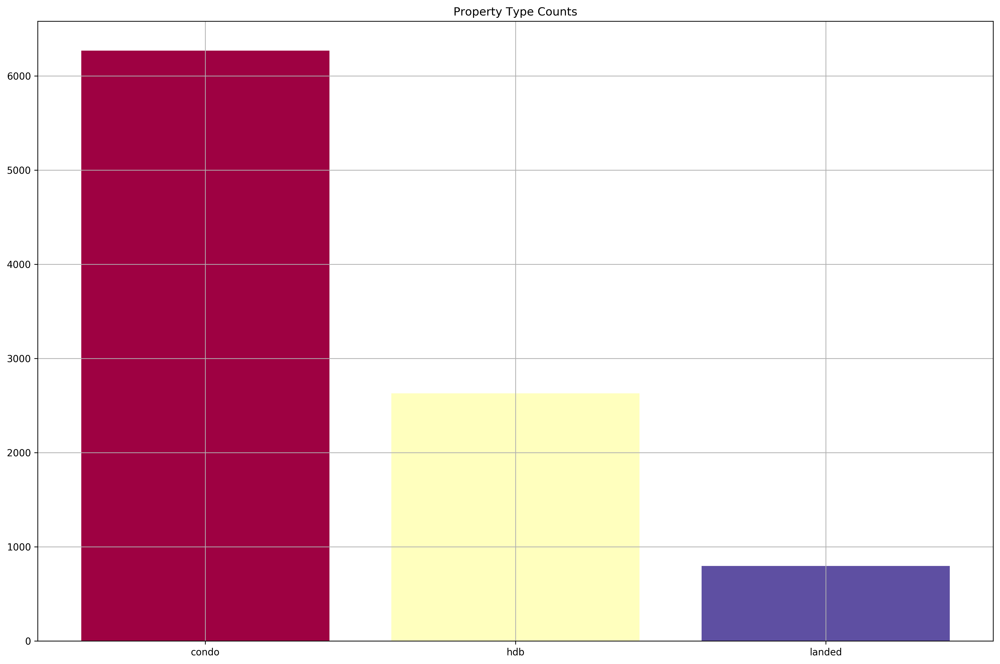

In [5]:
property_type_counts = cleaned_dataset['type'].value_counts()
plt.bar(property_type_counts.index, property_type_counts, color=get_colors(len(property_type_counts)))
plt.grid()
plt.title('Property Type Counts');

How about the district breakdown?

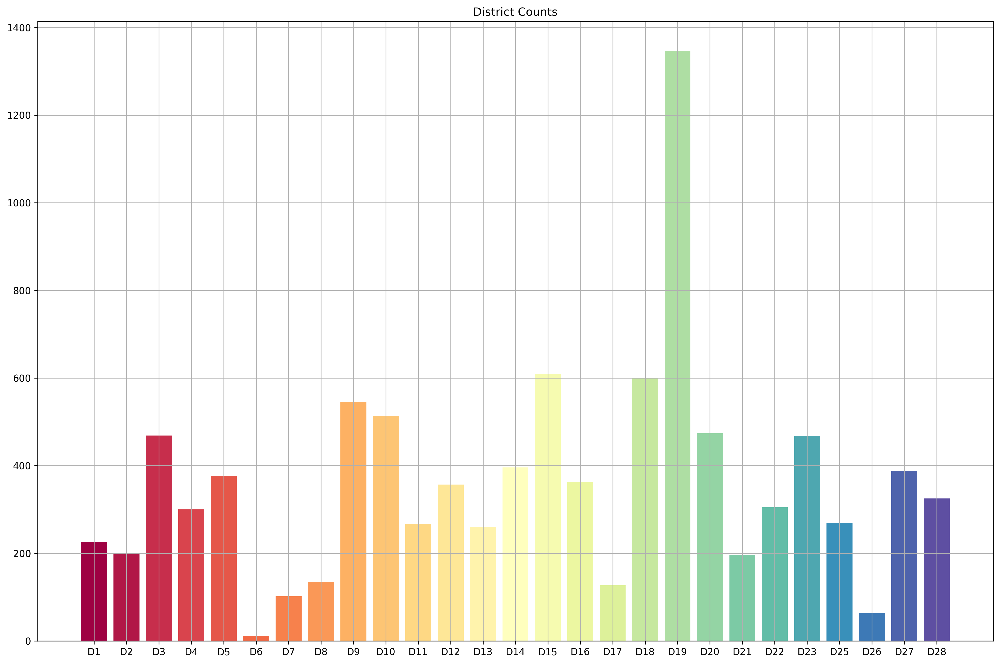

In [6]:
property_district_counts = sorted(cleaned_dataset['District'].value_counts().items(), key=lambda kv: int(kv[0][1:]))
districts, counts = list(zip(*property_district_counts))
plt.bar(districts, counts, color=get_colors(len(property_district_counts)))
plt.grid()
plt.title('District Counts');

We are missing `D24`, and it appears that we have a highly imbalanced dataset - we have really few `D6` and `D26` properties, and a ton of `D19` properties. Let's see the property type breakdown by district.

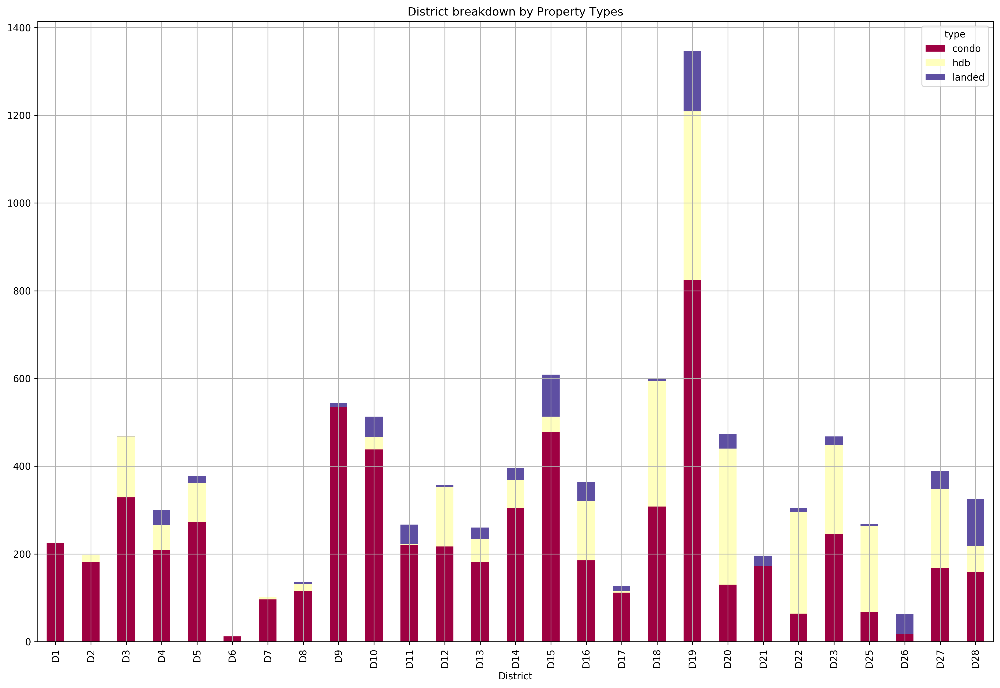

In [7]:
unstacked_district_counts_df = cleaned_dataset.groupby(['District', 'type']).count().iloc[:,0].unstack().loc[[*districts], :]
unstacked_district_counts_df.plot(
    kind='bar', 
    title='District breakdown by Property Types',
    colormap='Spectral', 
    stacked=True).grid();

We do seem to have an overwhelmingly larger portion of condominium observations compared to HDBs or Landed properties. Hence, we'll focus the analysis on condominiums.

## Condominiums

In [8]:
condo_X = cleaned_dataset[cleaned_dataset['type'] == 'condo']

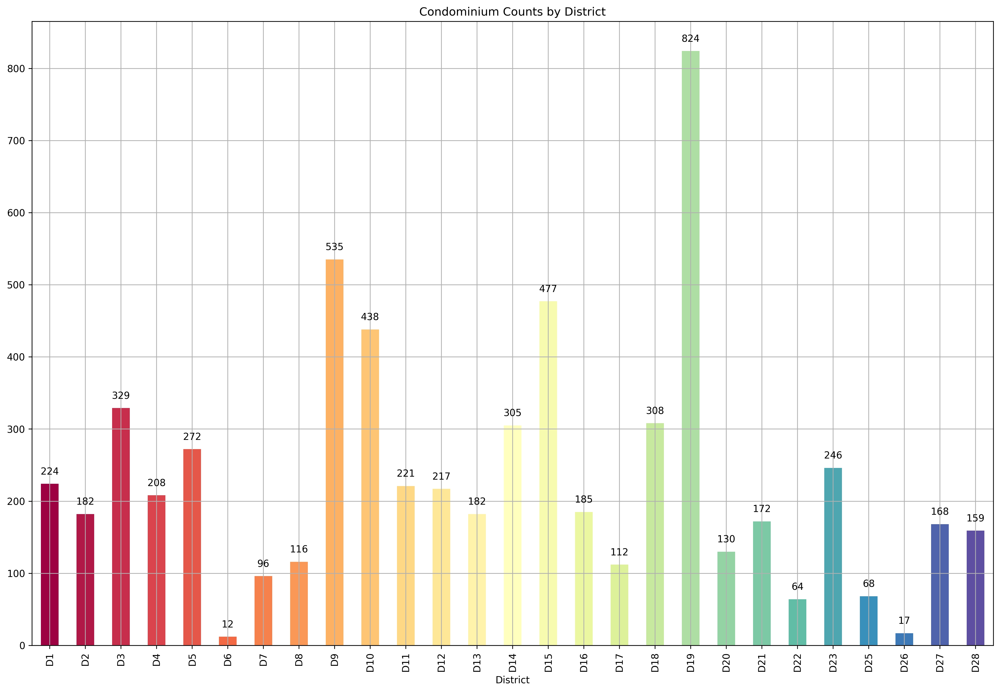

In [9]:
ax = plt.subplot()

condo_X.groupby(['District']).count().loc[[*districts], 'price'].plot(
    kind='bar', 
    title='Condominium Counts by District', 
    color=get_colors(len(districts)),
    ax=ax
).grid()

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x()+0.25, p.get_height()+10), 
                va='bottom', 
                ha='center',
                fontsize=10)

Let's take a look at the heat map of the features of our condominiums to get a sense of which features might be helpful in helping explain the `price` of a condo.

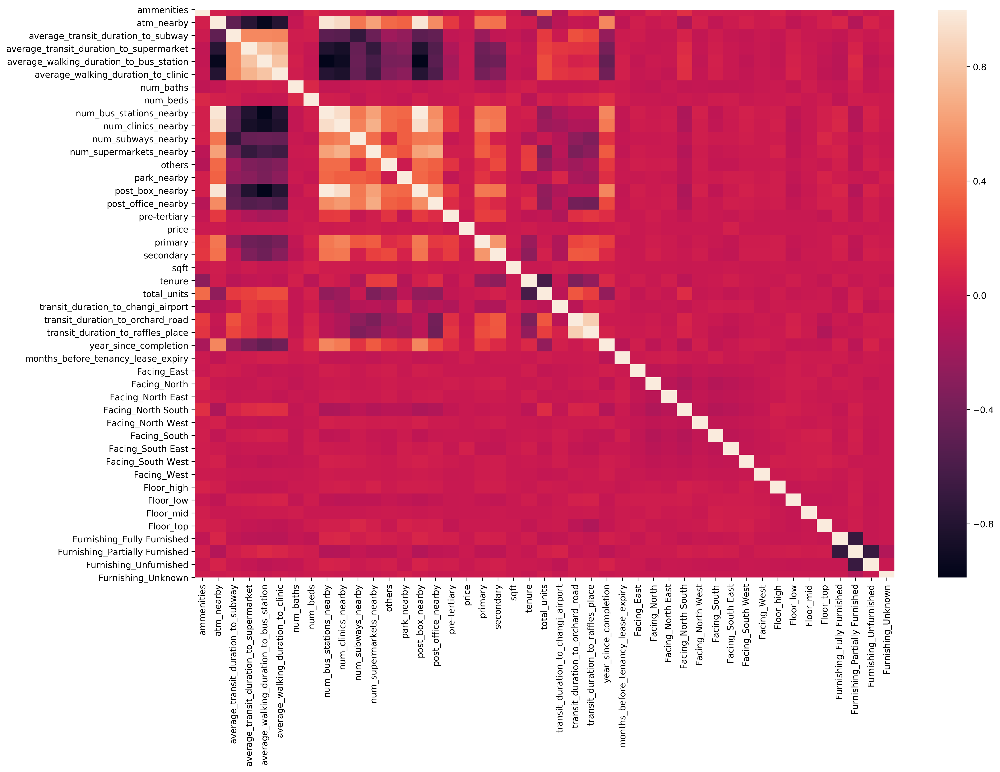

In [10]:
sns.heatmap(condo_X.drop(landed_specific_feats + special_feats + availability_feats, axis=1).corr());

Seems like there are no features that are correlated with `price`, but there are quite a few features that are either highly positively and negatively correlated with each other. For example, `average_transit_duration_to_subway`, `average_transit_duration_to_supermarket`, `average_walking_duration_to_bus_station`, `average_walking_duration_to_clinic` are highly positively correlated with each other, while they are highly negatively correlated with `atm_nearby`, a binary variable. Intuitively, this makes a lot of sense since places that are very accessible (near various transportation modes, clinics, and supermarkets) would likely be very near to atms. Let's take a closer look at those correlated features.

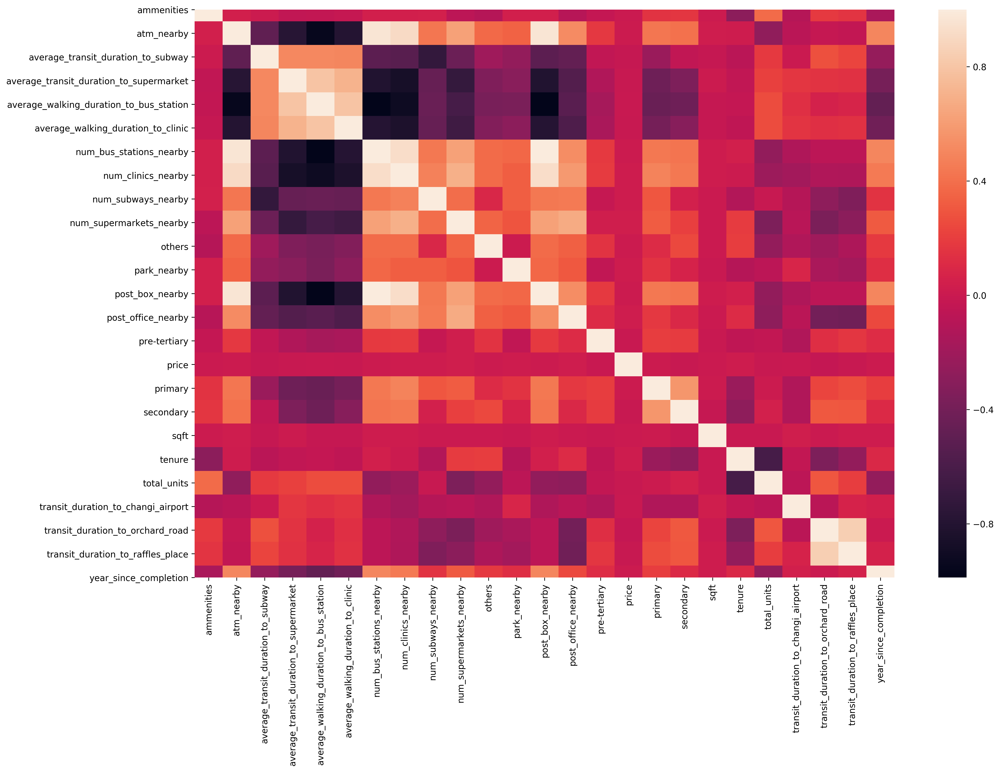

In [11]:
sns.heatmap(condo_X.drop([
    'num_baths', 
    'num_beds',
    'months_before_tenancy_lease_expiry',
    *[c for c in condo_X.columns if 
      c.lower()[:len('facing')] == 'facing' or 
      c.lower()[:len('condition')] == 'condition' or 
      c.lower()[:len('floor')] == 'floor' or 
      c.lower()[:len('furnishing')] == 'furnishing']] + landed_specific_feats + special_feats + availability_feats, axis=1).corr());

Let's zoom in to check on the `price` as well, just to make sure we aren't seeing anything abnormal.

In [12]:
condo_X['price'].describe()

count    6.267000e+03
mean     2.972129e+06
std      5.471618e+07
min      4.950000e+05
25%      9.950000e+05
50%      1.420000e+06
75%      2.081500e+06
max      3.850000e+09
Name: price, dtype: float64

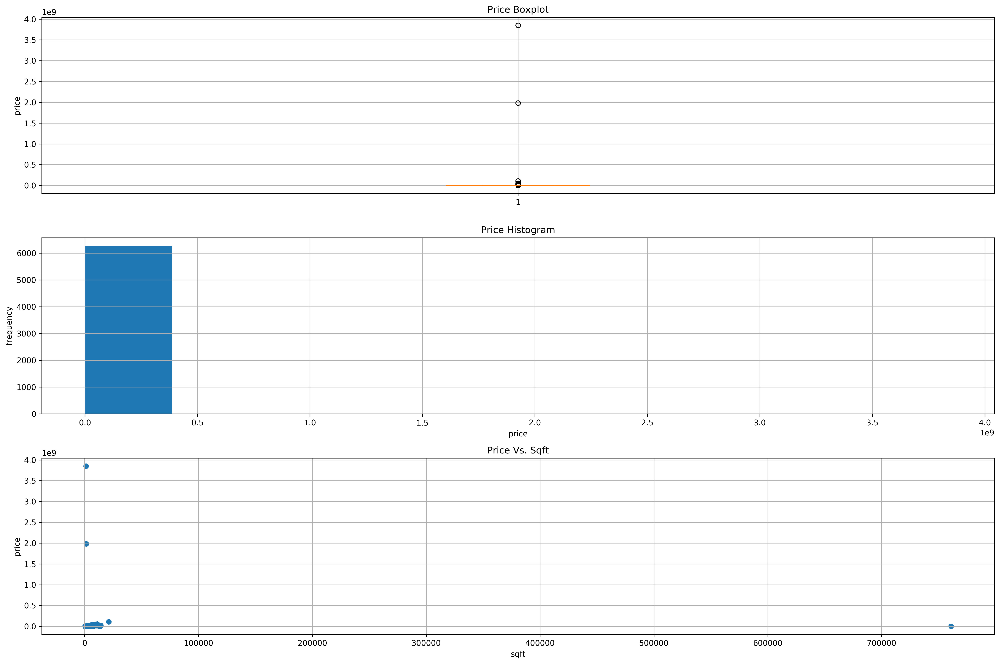

In [13]:
fig, ax = plt.subplots(3, 1)
ax[0].boxplot(condo_X['price'])
ax[0].set_ylabel('price')
ax[0].grid()
ax[0].set_title('Price Boxplot')
ax[1].hist(condo_X['price'])
ax[1].set_xlabel('price')
ax[1].set_ylabel('frequency')
ax[1].grid()
ax[1].set_title('Price Histogram')
ax[2].scatter(condo_X['sqft'], condo_X['price'])
ax[2].set_xlabel('sqft')
ax[2].set_ylabel('price')
ax[2].grid()
ax[2].set_title('Price Vs. Sqft')
plt.tight_layout()
plt.show();

We definitely see outliers over here. Firstly, we have 2 condominiums that are in the price range of billions (maybe possible for a very high class bungalow, but highly unlikely for any condo) and also a condo that's very low in price but with a huge sqft. Let's remove them.

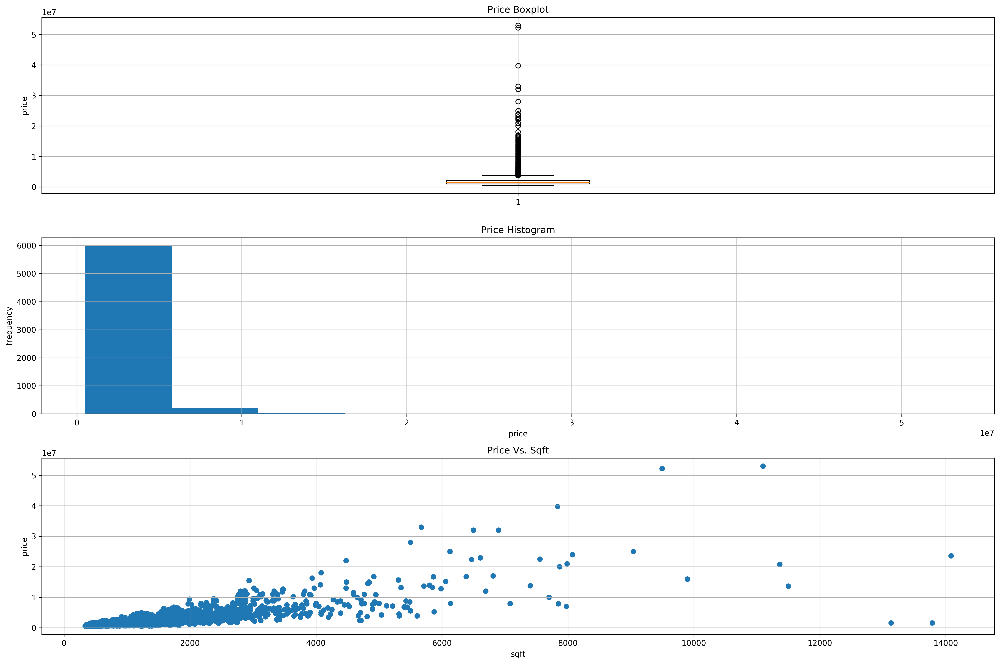

In [14]:
condo_X = condo_X[condo_X['price'] < 1e8] # Remove condos above 100 mil
condo_X = condo_X[condo_X['sqft'] < 7e5] # Remove that outlier condo with a huge sqft

fig, ax = plt.subplots(3, 1)
ax[0].boxplot(condo_X['price'])
ax[0].set_ylabel('price')
ax[0].grid()
ax[0].set_title('Price Boxplot')
ax[1].hist(condo_X['price'])
ax[1].set_xlabel('price')
ax[1].set_ylabel('frequency')
ax[1].grid()
ax[1].set_title('Price Histogram')
ax[2].scatter(condo_X['sqft'], condo_X['price'])
ax[2].set_xlabel('sqft')
ax[2].set_ylabel('price')
ax[2].grid()
ax[2].set_title('Price Vs. Sqft')
plt.tight_layout()
plt.show();

Much better! We see a good number of condos that have prices in the 10 mil and above range but below 60 mil that might probably be penthouses and majority of condos are below 10 mil logically. Let's proceed on with the Data Preparation stage!

<a id='data-prep'></a>

---
# Data Preparation

## Scaling

In [15]:
X_scaler, y_scaler = StandardScaler(), StandardScaler()

X = condo_X.drop([
    'num_baths', 
    'num_beds',
    'months_before_tenancy_lease_expiry',
    *[c for c in condo_X.columns if 
      c.lower()[:len('facing')] == 'facing' or 
      c.lower()[:len('condition')] == 'condition' or 
      c.lower()[:len('floor')] == 'floor' or 
      c.lower()[:len('furnishing')] == 'furnishing']] + landed_specific_feats + special_feats + availability_feats, axis=1)

X_scaled = pd.DataFrame(X_scaler.fit_transform(X), columns=X.columns) # This still includes the price
y_scaled = y_scaler.fit_transform(np.array(condo_X['price']).reshape(-1, 1)).ravel()

## Dimensionality Reduction

We do still have quite a few features even after dropping a bunch above, can we reduce them?

Total variance explained by 1 components: 37.44901012608501%
Total variance explained by 2 components: 50.52012742027444%
Total variance explained by 3 components: 58.2122032477493%
Total variance explained by 4 components: 63.71936324414935%
Total variance explained by 5 components: 68.10118454120607%
Total variance explained by 6 components: 72.09956046825472%
Total variance explained by 7 components: 75.78853575615108%
Total variance explained by 8 components: 79.1381882097906%
Total variance explained by 9 components: 82.17081188203308%
Total variance explained by 10 components: 85.17710652739778%
Total variance explained by 11 components: 87.69274718960978%
Total variance explained by 12 components: 89.96675917907427%
Total variance explained by 13 components: 92.13993991495079%
Total variance explained by 14 components: 93.70681147532277%
Total variance explained by 15 components: 95.06543260423634%
Total variance explained by 16 components: 96.26043798884034%
Total variance expl

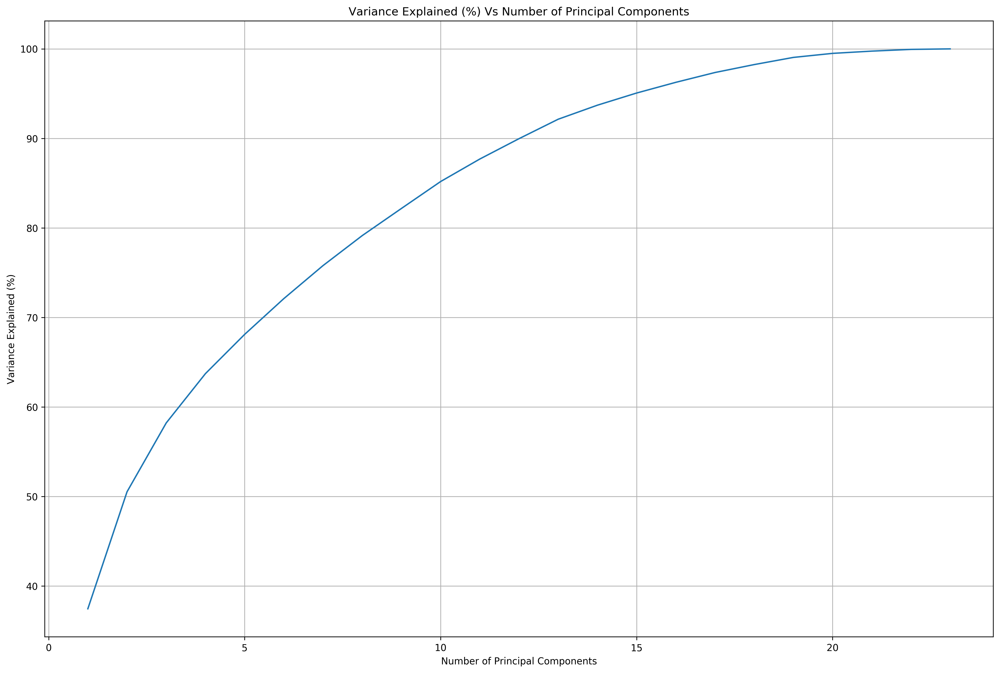

In [16]:
pca = {}
X_pca = {}
total_variance_explained = []
for n in range(1, len(X_scaled.drop(['price'], axis=1).columns)):    
    pca[n] = PCA(n_components=n)
    X_pca[n] = pca[n].fit_transform(X_scaled.drop(['price'], axis=1))
    total_variance_explained.append(np.sum(pca[n].explained_variance_ratio_))
    print('Total variance explained by {} components: {}%'.format(n, np.sum(pca[n].explained_variance_ratio_ * 100)))
    
plt.plot(list(pca.keys()), np.dot(total_variance_explained, 100))
plt.xlabel('Number of Principal Components')
plt.ylabel('Variance Explained (%)')
plt.title('Variance Explained (%) Vs Number of Principal Components')
plt.grid();

Total variance explained by 13 components: 92.13993991495077%


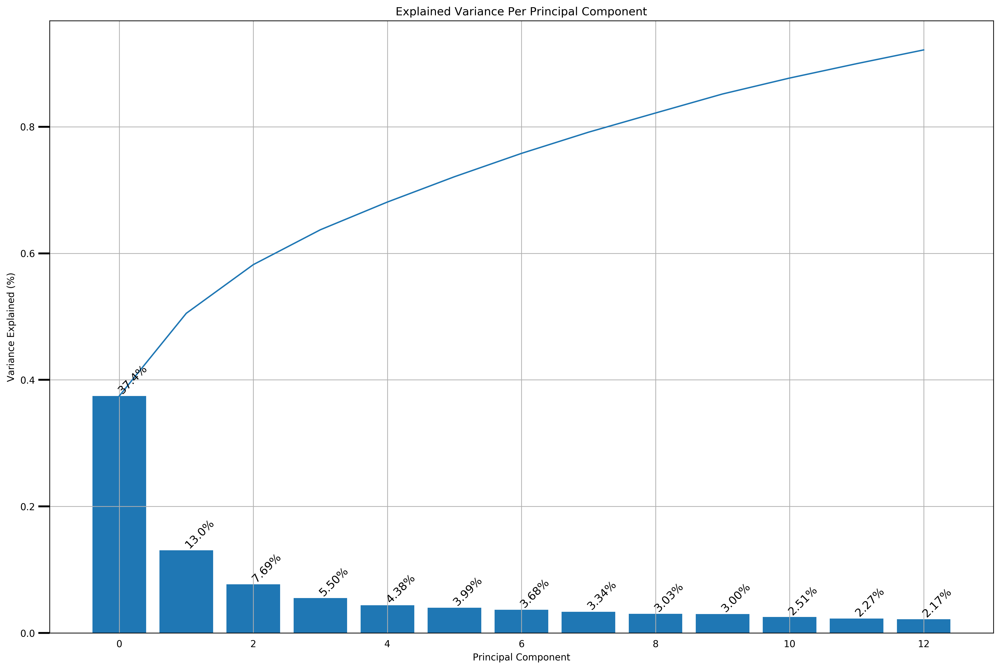

In [17]:
def scree_plot(pca):
    '''
    Function:
    ---------
    Creates a scree plot associated with the principal components 
    
    Parameters:
    -----------
    pca: the result of instantiation of PCA in scikit learn
            
    Returns:
    --------
    None
    '''
    num_components=len(pca.explained_variance_ratio_)
    ind = np.arange(num_components)
    vals = pca.explained_variance_ratio_
    print('Total variance explained by {} components: {}%'.format(num_components, np.sum(vals) * 100))
    
    ax = plt.subplot()
    cumvals = np.cumsum(vals)
    ax.bar(ind, vals)
    ax.plot(ind, cumvals)
    for i in range(num_components):
        ax.annotate(r"%s%%" % ((str(vals[i]*100)[:4])), (ind[i]+0.2, vals[i]), va='bottom', ha='center', fontsize=12, rotation=45)
 
    ax.xaxis.set_tick_params(width=0)
    ax.yaxis.set_tick_params(width=2, length=12)
 
    ax.set_xlabel('Principal Component')
    ax.set_ylabel('Variance Explained (%)')
    plt.title('Explained Variance Per Principal Component')
    plt.grid()
    plt.show();
    
for n_components, pca_obj in pca.items():
    if np.sum(pca_obj.explained_variance_ratio_ * 100) > 90:
        scree_plot(pca_obj)
        break

Because we want more intepretability of the features we use for the subsequent analyses, we'll use the original scaled features rather than any of the dimensionality reduced features using PCA. Furthermore, according to [this](http://blog.explainmydata.com/2012/07/should-you-apply-pca-to-your-data.html), PCA is highly sensitive to scale of the data, which makes me doubt whether we should really use PCA in this situation when we don't have a well-justified reason to use it.

<a id='model'></a>

---
# Modeling

## 1. Cluster Analysis

Currently, there are [28 designated districts](https://www.singaporeexpats.com/housing-in-singapore/singapore-district-guide.htm) in Singapore. After clustering our data, could we discern these 28 districts well, or is there a different clustering of the data?

We want to visualize the clusters created using the KMeans clustering algorithm which assigns data points to the cluster that the data point has the shortest euclidean distance to. Furthermore, since we have >3 features, we'll want to either visualize the clusters based on 2-3 features or like what we'll  be doing below, visualize the first 2 TSNE embeddings of the features, helping us best preserve the relative "distance" between data points in a lower dimensional space.

In [18]:
def visualize_clusters(X, silhouette_avg, cluster_labels, clusterer):
    """
    Function:
    ---------
    Visualize the number of clusters predicted according to the model
    
    Parameters:
    -----------
    X: The dataset to discover the clusters from
    silhouette_avg: The average silhouette score for all the samples
    cluster_labels: The predicted cluster labels by model
    clusterer: The fitted Kmeans model on X
    
    Returns:
    --------
    None.
    """
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # --------------------------------------------
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -0.2, 1
    ax1.set_xlim([-0.2, 1])
    
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (clusterer.n_clusters + 1) * 10])

    y_lower = 10
    colors = get_colors(clusterer.n_clusters)
    for i in range(clusterer.n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=colors[i], edgecolor=colors[i], alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([round(val, 2) for val in np.arange(-0.2, 1.1, 0.2)])
    ax1.grid()

    # --------------------------------------------
    # 2nd Plot showing the actual clusters formed using TSNE embedding
    labels_to_colors = [colors[label] for label in cluster_labels]
    
    # Create TSNE Embeddings
    X_embedded = TSNE(n_components=2).fit_transform(X)
    
    ax2.scatter(X_embedded[:, 0], X_embedded[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=labels_to_colors, edgecolor='k')

    # Labeling the clusters
    # Get the indices of the data points that are closest to the cluster centers 
    closest_data_points_indices, _ = pairwise_distances_argmin_min(clusterer.cluster_centers_, X)
    closest_data_points = np.array([X_embedded[idx] for idx in closest_data_points_indices])
    
    # Draw white circles at those approximate cluster centers
    ax2.scatter(closest_data_points[:, 0], closest_data_points[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(closest_data_points):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st TSNE Embedding")
    ax2.set_ylabel("Feature space for the 2nd TSNE Embedding")
    ax2.grid()

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % clusterer.n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show();

But how will we choose the "optimal" number of clusters? We will be using 2 metrics:
1. [KMeans objective: The Within-Cluster Sum of Squares (WCSS) / Variance](https://en.wikipedia.org/wiki/K-means_clustering)
    - The pairwise squared deviations of points in the same cluster
    - If every data point is it's own cluster, this metric will be 0
    
$$
\underset{ \mathbf{S} }{ \operatorname{arg\,min} } \sum_{i=1}^{k} \sum_{ \mathbf{x} \in S_i} {\mid \mathbf{x} - \boldsymbol{\mu_i} \mid}^2 = \underset{ \mathbf{S} } {\operatorname{arg\,min} }\sum_{i=1}^k \mid S_i \mid \operatorname{Var} S_i, \text{ where } \mu_i \text{ is the mean of points in } S_i
$$
    
2. [The Silhouette Score](https://en.wikipedia.org/wiki/Silhouette_(clustering))
    - A measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation)
    
The goal for choosing the best number of clusters becomes a problem of trying to find the number of clusters that best maximizes the silhouette score, but yet minimizes the WCSS. This is what's known as a multi-objective optimization problem (You can learn more about it [here](https://engineering.purdue.edu/~sudhoff/ee630/Lecture09.pdf)). In multi-objective optimization problems, it's very rare to find a single most optimal solution for the problem. Instead, we'll find what is called a "Pareto Optimal Set / Pareto-efficient Frontier" which is a set of solutions that are not "dominated" by any others. "Not Dominated" intuitively meaning that a solution does not have any other solutions that are better than it in all objectives. Below, we have a written a function that does just this - determine the pareto frontier and plot it.

In [19]:
def plot_pareto_frontier(X, Y, n_clusters, ax, maxX=True, maxY=True):
    """
    Function:
    ---------
    Plots the pareto frontier given costs X and Y for choosing
    number of clusters
    
    Parameters:
    -----------
    X: list of WCSS scores for each of the number of clusters
    Y: list of Silhouette scores for each of the number of clusters
    n_clusters: list of number of clusters 
    ax: axis to plot the pareto frontier
    maxX: Bool, True if we are trying to maximize X, false if minimize X
    maxY: Bool, True if we are trying to maximize Y, false if minimize Y
    
    Returns:
    --------
    pareto_front: The pareto frontier tuples containing number
                  of clusters, wcss score, and silhouette score
                  (wcss score, silhouette score, n_clusters)
    """
    # Start with all elements in pareto front,
    # then remove all the non-dominating elements in outer for loop
    X_scaler, Y_scaler = MinMaxScaler(), MinMaxScaler()
    X_scaled, Y_scaled = X_scaler.fit_transform(np.array(X).reshape(-1, 1)), Y_scaler.fit_transform(np.array(Y).reshape(-1, 1))
    pareto_front = sorted(list(zip(X_scaled, Y_scaled, n_clusters)), key=lambda val: val[1], reverse=maxY)

    # idx - index of last added dominating element in our pareto front
    for idx in range(len(pareto_front)):
        # Remove all elements that have X larger than the last dominating element
        # of the pareto frontier
        for xy in pareto_front[idx+1:]:
            # Maximize X
            if maxX:
                if pareto_front[idx][0] > xy[0]:
                    pareto_front.remove(xy)
            # Minimize X
            else:
                if pareto_front[idx][0] < xy[0]:
                    pareto_front.remove(xy)

        # Now our search space has been confined to elements
        # that have a smaller X (good), but not so good Y,
        # so we can move to idx+1
    
    '''Plotting process'''
    normalized_wcss_scores, normalized_silhouette_avg_scores = list(zip(*pareto_front))[:2]
    ax.scatter(X_scaled, Y_scaled, c='g', marker='s')
    ax.plot(normalized_wcss_scores, normalized_silhouette_avg_scores, linestyle=':', linewidth=2, marker='s', color='g', markersize=12)
    ax.set_xlabel('Normalized WCSS (Minimization Objective)');
    ax.set_ylabel('Normalized Silhouette Score (Maximization Objective)');
    ax.set_title('Pareto Frontier')
    ax.grid()
    
    return [(X_scaler.inverse_transform(np.array(normalized_wcss_score).reshape(-1, 1)), 
             Y_scaler.inverse_transform(np.array(normalized_silhouette_avg_score).reshape(-1, 1)), 
             k) for normalized_wcss_score, normalized_silhouette_avg_score, k in pareto_front]

But how will we choose the "best" clustering from this reduced pareto-optimal set? For now, we'll determine the "best" clustering using the silhouette scores of each data point - our objective is "out of all the clusterings in the pareto frontier, choose the clustering that best minimizes the mean squared error and mean absolute error of each data point's silhouette score to the average silhouette score". In simple terms, we just want clusterings that have individual sample silhouette scores that are more or less similar to everyone else's.

In [20]:
def find_best_n_clusters(X, range_n_clusters, actual_clusters, property_links):
    """
    Function:
    ---------
    Visualize the number of clusters predicted according to the model
    
    Parameters:
    -----------
    X: The dataset to discover the clusters from
    range_n_clusters: list of the different number of clusters to fit Kmeans on
    actual_clusters: pandas series of the actual clusters designated by the Singapore government
    property_links: pandas series of the web urls for each condominium in our dataset
    
    Returns:
    --------
    pandas dataframe with the cluster predictions for model with subjectively best WCSS and
    Silhouette score tradeoff on pareto frontier
    """
    # Silhouette scores for different number of clusters
    silhouette_avg_scores = []
    # Inertia / Within-cluster Sum of Squares scores for different number of clusters
    wcss_scores = []
    # Dictionary of the Kmeans models fitted on different number of clusters
    clusterers = {}
    # Dictionary of the predicted cluster labels for each sample by the fitted Kmeans models
    cluster_labels = {}
    
    for n_clusters in range_n_clusters:

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterers[n_clusters] = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels[n_clusters] = clusterers[n_clusters].fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels[n_clusters])
        silhouette_avg_scores.append((n_clusters, silhouette_avg))
        
        # Save the WCSS
        wcss_scores.append((n_clusters, clusterers[n_clusters].inertia_))
        
        print("For n_clusters=", n_clusters,
              " Average silhouette_score:", silhouette_avg, 
              " WCSS:", clusterers[n_clusters].inertia_)
      
    # Plot how the WCSS and silhouette scores change with n_clusters
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.set_size_inches(18, 7)
    
    # 1st: Plot silhouette scores
    ax1.plot(*list(zip(*silhouette_avg_scores)), linestyle='--', marker='o', color='b')
    ax1.set_xlabel('K');
    ax1.set_ylabel('Silhouette Score');
    ax1.set_title('Silhouette Score vs. K')
    ax1.grid()
    
    # 2nd: Plot wcss scores
    ax2.plot(*list(zip(*wcss_scores)), linestyle='--', marker='*', color=get_colors(1)[0]);
    ax2.set_xlabel('K');
    ax2.set_ylabel('WCSS');
    ax2.set_title('WCSS vs. K')
    ax2.grid()
    
    # 3rd: Plot Pareto frontier for multiobjective optimization
    # Minimize WCSS while Maximizing Silhouette score
    pareto_front = plot_pareto_frontier(X=list(zip(*wcss_scores))[1], 
                                        Y=list(zip(*silhouette_avg_scores))[1], 
                                        n_clusters=list(zip(*wcss_scores))[0], 
                                        ax=ax3, 
                                        maxX=False, 
                                        maxY=True)
    
    plt.suptitle(('Scoring metrics against Number of clusters fitted, K'),
                 fontsize=14, fontweight='bold')
    plt.show();
    
    # Visualize the clusters for model with the 
    # silhouette score and wcss score on pareto frontier
    # Select the number of clusters that best minimize the
    # mean squared error and mean absolute error of 
    # silhouette scores of each sample with the average silhouette score
    best_k, best_mae, best_mse = 2, sys.maxsize, sys.maxsize
    for wcss_score, silhouette_avg, k in pareto_front: 
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels[k])
        cluster_mse, cluster_mae = list(zip(*[(np.mean(np.subtract(sample_silhouette_values[cluster_labels[k] == i], silhouette_avg)**2), 
                                               np.mean(np.abs(np.subtract(sample_silhouette_values[cluster_labels[k] == i], silhouette_avg)))) for i in range(k)]))
        total_mse, total_mae = np.mean(cluster_mse), np.mean(cluster_mae)
        print('k:', k,
              'MSE:', total_mse,
              'MAE:', total_mae)
        if best_mse > total_mse and best_mae > total_mae and silhouette_avg > 0:
            best_k, best_mae, best_mse = k, total_mae, total_mse
            
    visualize_clusters(X, silhouette_avg, cluster_labels[best_k], clusterers[best_k])

    return pd.concat([
        pd.DataFrame(X, columns=['pc_{}'.format(idx) for idx in range(1, X.shape[1]+1)]), 
        actual_clusters.apply(lambda val: int(val[1:])).reset_index().drop('index', axis=1), 
        pd.Series(cluster_labels[best_k], name='pred_cluster'),
        property_links.reset_index().drop('index', axis=1)
    ], axis=1)

Cluster Analysis with selected scaled raw features of each condominium
--------------------------------------------------
--------------------------------------------------
For n_clusters= 2  Average silhouette_score: 0.3549972906518493  WCSS: 105137.50727576688
For n_clusters= 3  Average silhouette_score: 0.2411975205930827  WCSS: 90997.57615879267
For n_clusters= 4  Average silhouette_score: 0.24954355674479473  WCSS: 85226.07668492352
For n_clusters= 5  Average silhouette_score: 0.23013095818941526  WCSS: 80151.31782820313
For n_clusters= 6  Average silhouette_score: 0.22886253996933206  WCSS: 75324.3209739146
For n_clusters= 7  Average silhouette_score: 0.23012537957319412  WCSS: 70741.85635861049
For n_clusters= 8  Average silhouette_score: 0.2304048303672874  WCSS: 67573.49802118186
For n_clusters= 9  Average silhouette_score: 0.18111757089998443  WCSS: 64560.15727866402
For n_clusters= 10  Average silhouette_score: 0.18986759762627758  WCSS: 61833.97083530403
For n_clusters= 11 

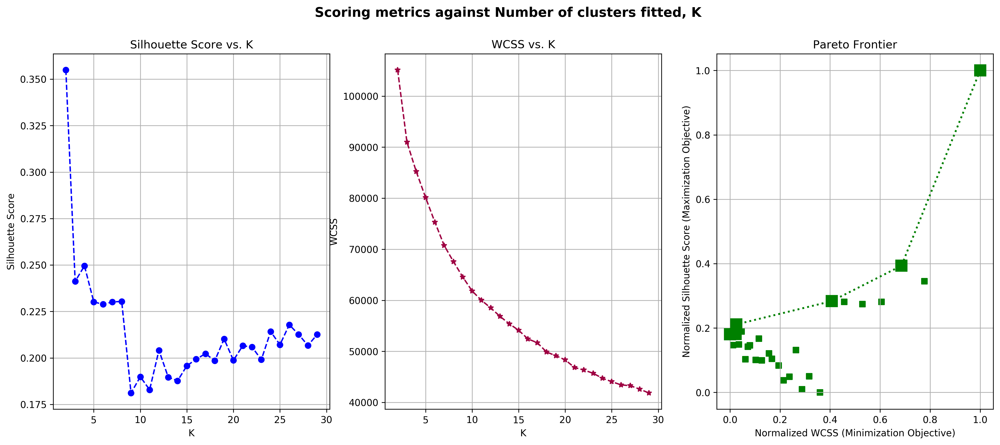

k: 2 MSE: 0.029432588124124182 MAE: 0.1419059891293578
k: 4 MSE: 0.03360509329087829 MAE: 0.14578550140952135
k: 8 MSE: 0.030116199066125872 MAE: 0.14257165603216454
k: 26 MSE: 0.03776506483417667 MAE: 0.15482947653698487
k: 27 MSE: 0.027292233532538155 MAE: 0.1310073747753424
k: 29 MSE: 0.030750226150408833 MAE: 0.13793852254050484


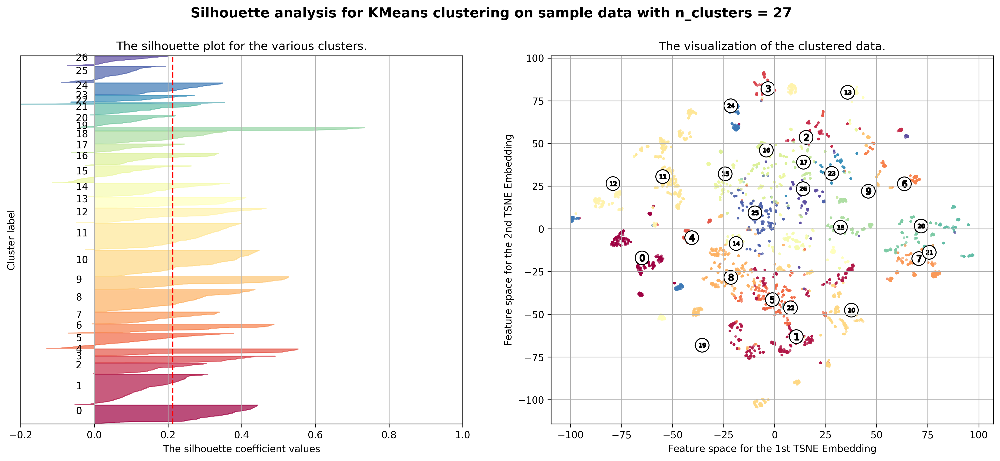

In [21]:
range_n_clusters = list(range(2, 30))
print('Cluster Analysis with selected scaled raw features of each condominium')
print(''.join(['-' for i in range(50)]))
print(''.join(['-' for i in range(50)]))
clustered_df = find_best_n_clusters(X_scaled, range_n_clusters, condo_X['District'], condo_X['link'])

We observe that in the "WCSS Vs. K" plot, there isn't a directly obvious "elbow" in the graph, making it hard for us to use the "elbow" method in order to determine the best number of clusters for our data, which is why we chose to complement the decision with silhouette scores too. Number of clusters $k=2, 4, 5, 8, 9, 29$ all lie on the pareto frontier making them candidates for the best number of clusters. However, according to the MSE and MAE silhouette scores, $k=2$ still performs the best, which is why we chose to use it in the end.

In [22]:
def top_k_districts(condo_cluster, condo_counts_by_district, cluster, k=5):
    """
    Function:
    ---------
    Prints the top K highest frequency districts obtained from
    our cluster analysis
    
    Parameters:
    -----------
    condo_cluster: pandas series of index as the districts in singapore and values 
                   as the frequency of that district in the cluster predicted by the model
    condo_counts_by_district: pandas series of the counts of each district 
    cluster: the predicted cluster (int)
    k: top k highest frequency districts as a percentage of the total number of 
       samples of each district we have in predicted cluster
    
    Returns:
    --------
    None.
    """
    top_k_districts = [(district, sg_districts[district]) for district in condo_cluster.divide(condo_counts_by_district).sort_values()[-k:][::-1].index]
    print('Top {} districts associated with Predicted Cluster {}:'.format(k, cluster))
    print(''.join(['-' for i in range(50)]))
    for idx, district in enumerate(top_k_districts):
        print('{}. {} -'.format(idx+1, district[0]), district[1][0], '-', district[1][1])

def cluster_district_breakdown(df, condo_X):
    """
    Function:
    ---------
    Plots the breakdown of frequency of each singapore district inside the predicted cluster
    and overlayed over the total frequency of each district in the context of condominiums
    
    Parameters:
    -----------
    df: pandas dataframe returned from find_best_n_clusters
    condo_X: the original raw dataframe with just condos
    
    Returns:
    --------
    None.
    """
    print(''.join(['-' for i in range(50)]))
    print(''.join(['-' for i in range(50)]))
    
    # Plot the breakdown of district frequency for each cluster
    for cluster in range(df.pred_cluster.nunique()):
        
        fig, ax = plt.subplots(1, 1)
        fig.set_size_inches(18, 7)

        # Plot the breakdown of total condos per district that we have in 
        # our dataset
        condo_counts_by_district = condo_X.groupby(['District']).count().loc[[*districts], 'price']
        condo_counts_by_district.index = condo_counts_by_district.index.map(lambda val: int(val[1:]))
        condo_counts_by_district.plot(
            kind='bar', 
            color=list(map(lambda val: np.append(val[:3], val[3]*0.1), get_colors(len(condo_counts_by_district)))),
            ax=ax
        ).grid()
        
        # Plot the district counts for a predicted cluster
        condo_cluster_counts = df[df['pred_cluster'] == int(cluster)]['District'].value_counts()
        condo_cluster = pd.Series(condo_cluster_counts, index=condo_counts_by_district.index).fillna(0.0).astype(int)
        condo_cluster.plot(
            kind='bar', 
            title='District Frequency for Condominiums in Predicted Cluster {}'.format(cluster), 
            color=get_colors(len(condo_cluster)),
            ax=ax
        ).grid()

        for p in ax.patches:
            ax.annotate(str(p.get_height()), (p.get_x()+0.25, p.get_height()+10), 
                        va='bottom', 
                        ha='center',
                        fontsize=10)
            
        plt.tight_layout()
        plt.show()
        
        top_k_districts(condo_cluster, condo_counts_by_district, cluster)
        print(''.join(['-' for i in range(50)]))
        print(''.join(['-' for i in range(50)]))
        

--------------------------------------------------
--------------------------------------------------


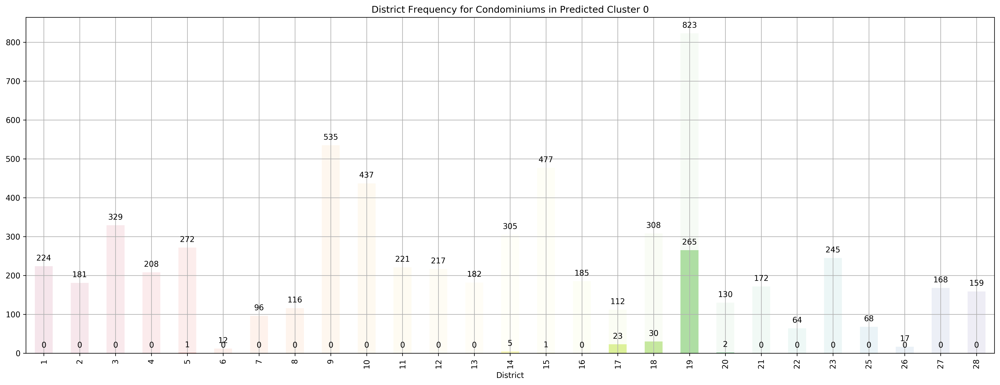

Top 5 districts associated with Predicted Cluster 0:
--------------------------------------------------
1. 19 - North East - Hougang, Punggol, Sengkang
2. 17 - Far East - Changi, Loyang, Pasir Ris
3. 18 - Far East - Pasir Ris, Simei, Tampines
4. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
5. 20 - Central North - Ang Mo Kio, Bishan, Braddell Road, Thomson
--------------------------------------------------
--------------------------------------------------


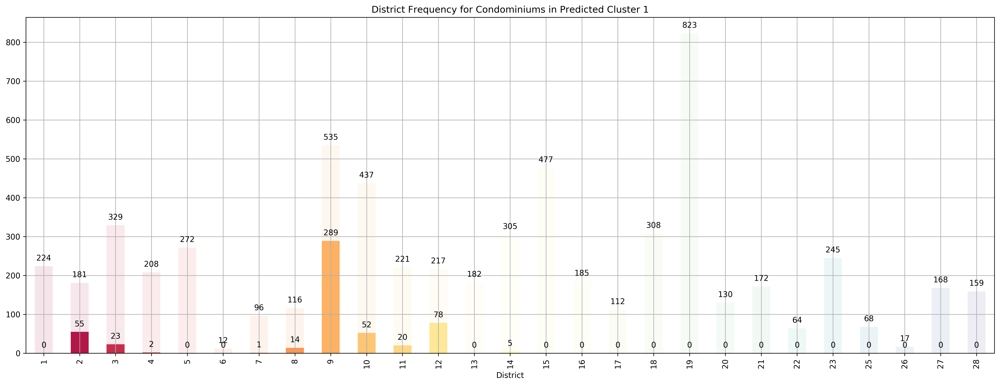

Top 5 districts associated with Predicted Cluster 1:
--------------------------------------------------
1. 9 - Central Orchard - Cairnhill, Killiney, Leonie Hill, Orchard, Oxley
2. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
3. 2 - City Business District - Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar
4. 8 - Central - Little India, Farrer Park, Serangoon Road
5. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
--------------------------------------------------
--------------------------------------------------


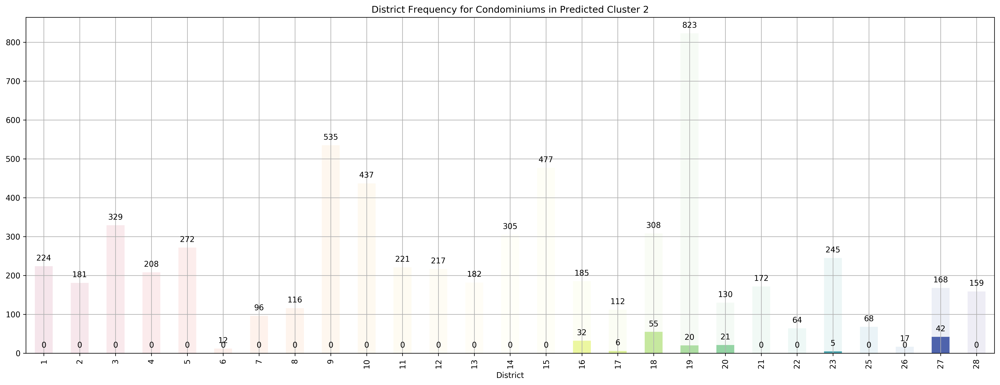

Top 5 districts associated with Predicted Cluster 2:
--------------------------------------------------
1. 27 - Far North - Admiralty, Sembawang, Yishun
2. 18 - Far East - Pasir Ris, Simei, Tampines
3. 16 - Upper East Coast - Bayshore, Bedok, Chai Chee
4. 20 - Central North - Ang Mo Kio, Bishan, Braddell Road, Thomson
5. 17 - Far East - Changi, Loyang, Pasir Ris
--------------------------------------------------
--------------------------------------------------


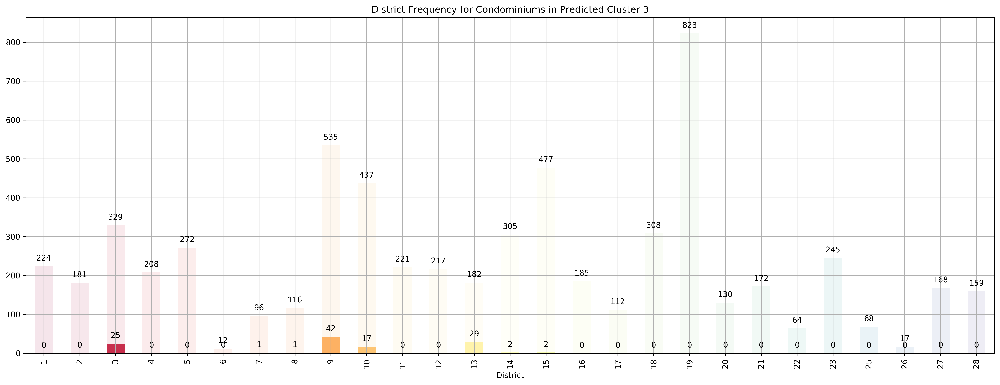

Top 5 districts associated with Predicted Cluster 3:
--------------------------------------------------
1. 13 - Central East - Potong Pasir, Machpherson
2. 9 - Central Orchard - Cairnhill, Killiney, Leonie Hill, Orchard, Oxley
3. 3 - Central South - Alexandra Road, Tiong Bahru, Queenstown
4. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
5. 7 - City - Beach Road, Bencoolen Road, Bugis, Rochor
--------------------------------------------------
--------------------------------------------------


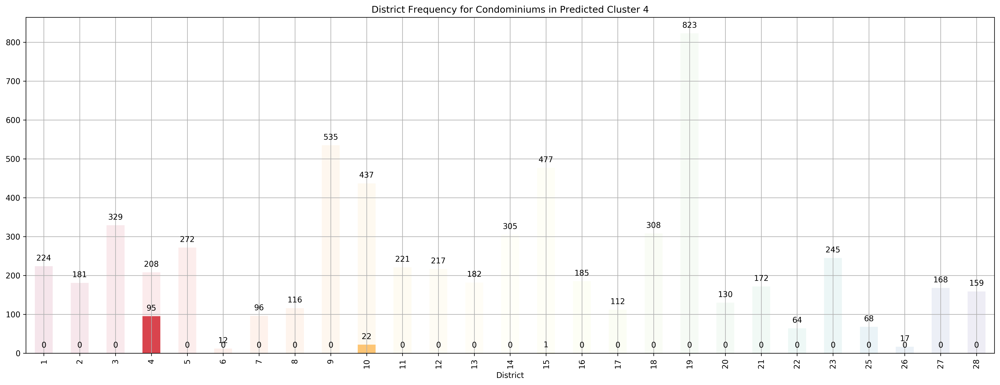

Top 5 districts associated with Predicted Cluster 4:
--------------------------------------------------
1. 4 - South - Keppel, Mount Faber, Sentosa, Telok Blangah
2. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
3. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
4. 28 - North East - Seletar, Yio Chu Kang
5. 13 - Central East - Potong Pasir, Machpherson
--------------------------------------------------
--------------------------------------------------


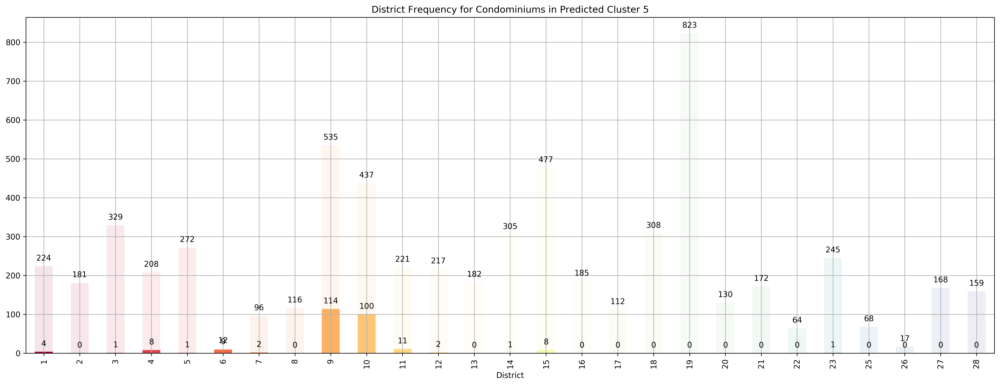

Top 5 districts associated with Predicted Cluster 5:
--------------------------------------------------
1. 6 - City Business District - City Hall, High Street, North Bridge Road
2. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
3. 9 - Central Orchard - Cairnhill, Killiney, Leonie Hill, Orchard, Oxley
4. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
5. 4 - South - Keppel, Mount Faber, Sentosa, Telok Blangah
--------------------------------------------------
--------------------------------------------------


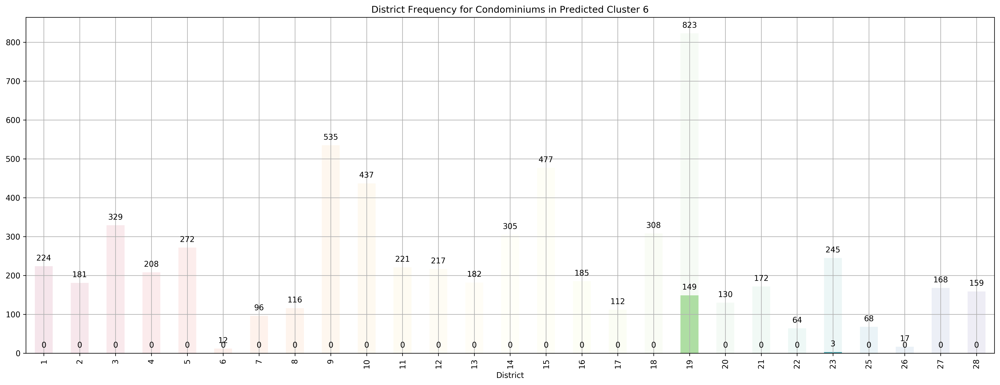

Top 5 districts associated with Predicted Cluster 6:
--------------------------------------------------
1. 19 - North East - Hougang, Punggol, Sengkang
2. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
3. 28 - North East - Seletar, Yio Chu Kang
4. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
5. 2 - City Business District - Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar
--------------------------------------------------
--------------------------------------------------


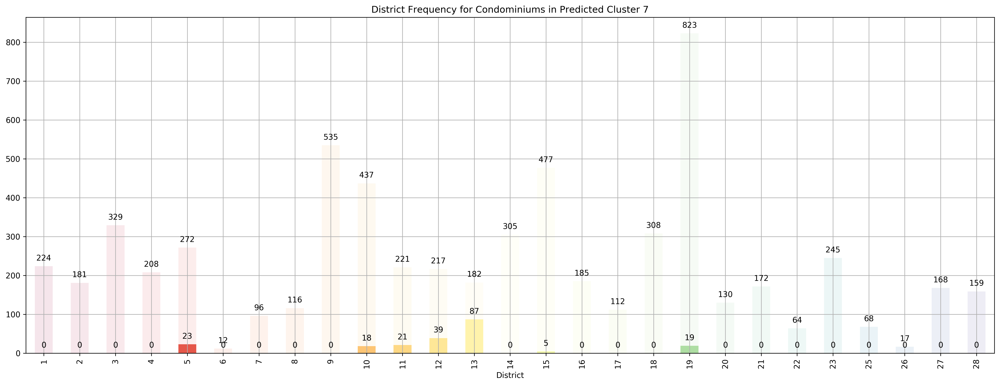

Top 5 districts associated with Predicted Cluster 7:
--------------------------------------------------
1. 13 - Central East - Potong Pasir, Machpherson
2. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
3. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
4. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
5. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
--------------------------------------------------
--------------------------------------------------


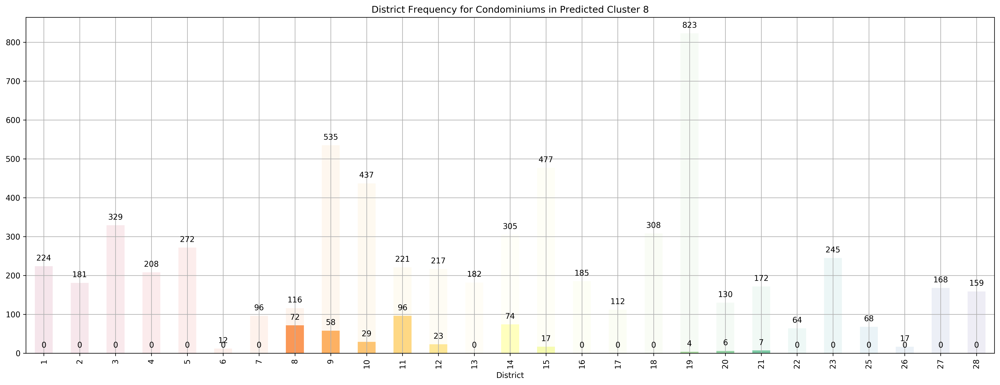

Top 5 districts associated with Predicted Cluster 8:
--------------------------------------------------
1. 8 - Central - Little India, Farrer Park, Serangoon Road
2. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
3. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
4. 9 - Central Orchard - Cairnhill, Killiney, Leonie Hill, Orchard, Oxley
5. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
--------------------------------------------------
--------------------------------------------------


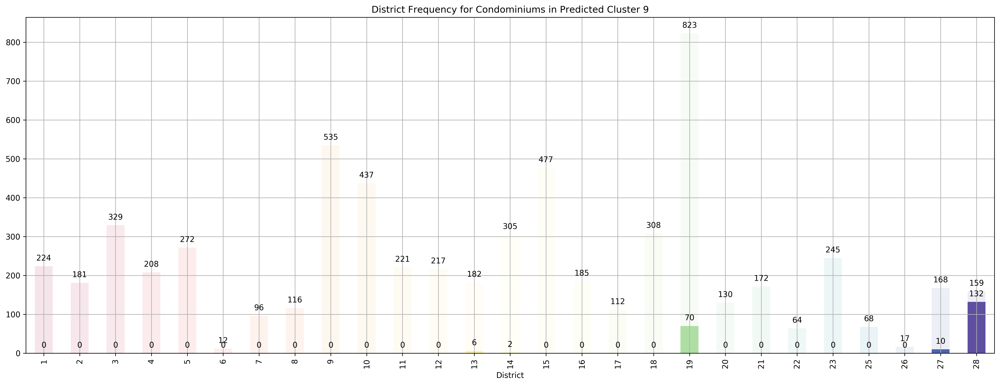

Top 5 districts associated with Predicted Cluster 9:
--------------------------------------------------
1. 28 - North East - Seletar, Yio Chu Kang
2. 19 - North East - Hougang, Punggol, Sengkang
3. 27 - Far North - Admiralty, Sembawang, Yishun
4. 13 - Central East - Potong Pasir, Machpherson
5. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
--------------------------------------------------
--------------------------------------------------


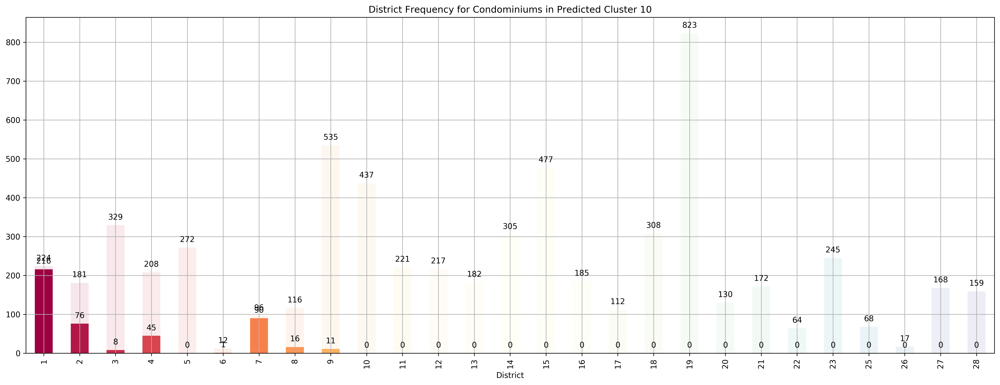

Top 5 districts associated with Predicted Cluster 10:
--------------------------------------------------
1. 1 - City Business District - Boat Quay, Chinatown, Havelock Road, Marina Square, Raffles Place, Suntec City
2. 7 - City - Beach Road, Bencoolen Road, Bugis, Rochor
3. 2 - City Business District - Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar
4. 4 - South - Keppel, Mount Faber, Sentosa, Telok Blangah
5. 8 - Central - Little India, Farrer Park, Serangoon Road
--------------------------------------------------
--------------------------------------------------


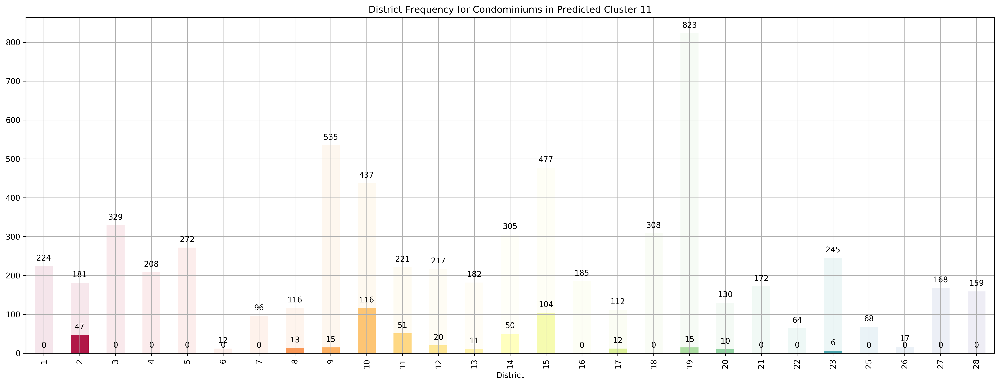

Top 5 districts associated with Predicted Cluster 11:
--------------------------------------------------
1. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
2. 2 - City Business District - Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar
3. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
4. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
5. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
--------------------------------------------------
--------------------------------------------------


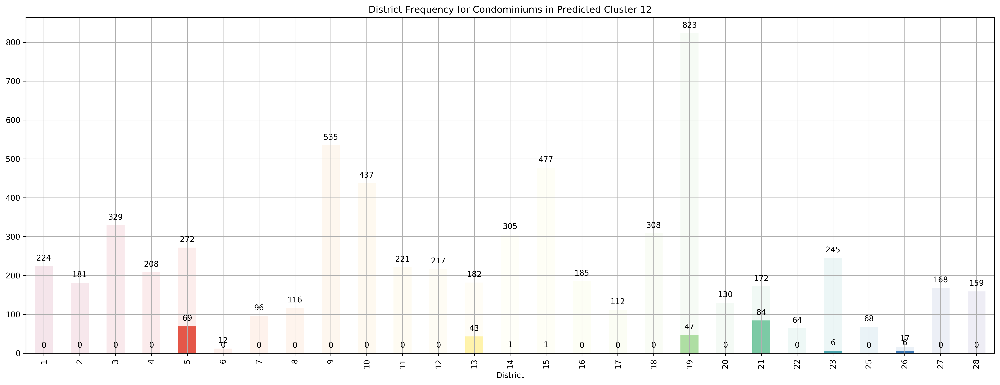

Top 5 districts associated with Predicted Cluster 12:
--------------------------------------------------
1. 21 - Central West - Clementi, Upper Bukit Timah, Hume Avenue
2. 26 - North - Tagore, Yio Chu Kang
3. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
4. 13 - Central East - Potong Pasir, Machpherson
5. 19 - North East - Hougang, Punggol, Sengkang
--------------------------------------------------
--------------------------------------------------


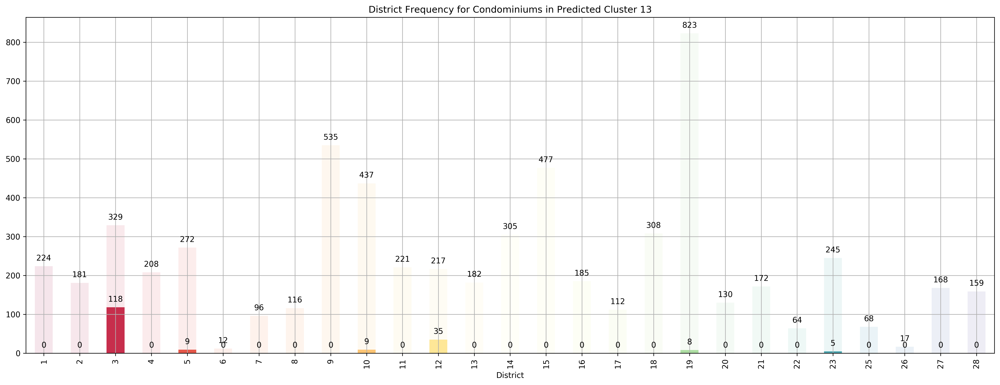

Top 5 districts associated with Predicted Cluster 13:
--------------------------------------------------
1. 3 - Central South - Alexandra Road, Tiong Bahru, Queenstown
2. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
3. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
4. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
5. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
--------------------------------------------------
--------------------------------------------------


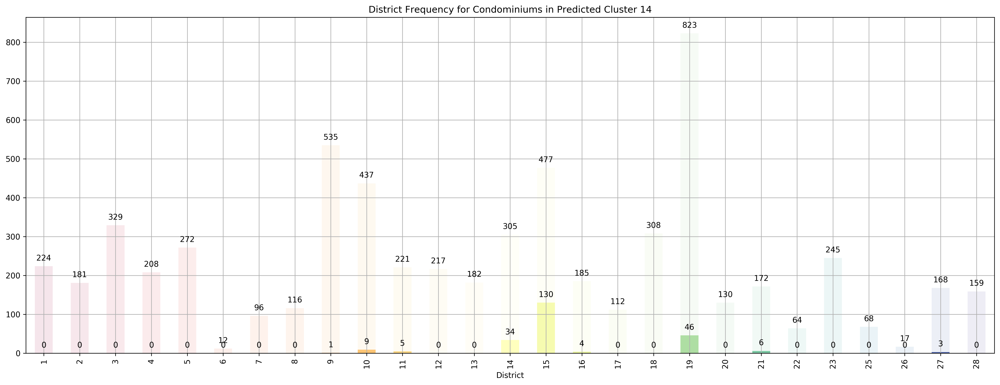

Top 5 districts associated with Predicted Cluster 14:
--------------------------------------------------
1. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
2. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
3. 19 - North East - Hougang, Punggol, Sengkang
4. 21 - Central West - Clementi, Upper Bukit Timah, Hume Avenue
5. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
--------------------------------------------------
--------------------------------------------------


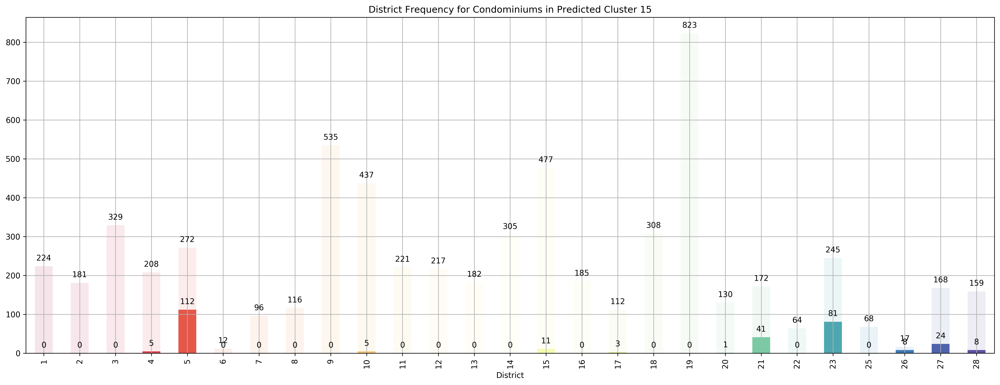

Top 5 districts associated with Predicted Cluster 15:
--------------------------------------------------
1. 26 - North - Tagore, Yio Chu Kang
2. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
3. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
4. 21 - Central West - Clementi, Upper Bukit Timah, Hume Avenue
5. 27 - Far North - Admiralty, Sembawang, Yishun
--------------------------------------------------
--------------------------------------------------


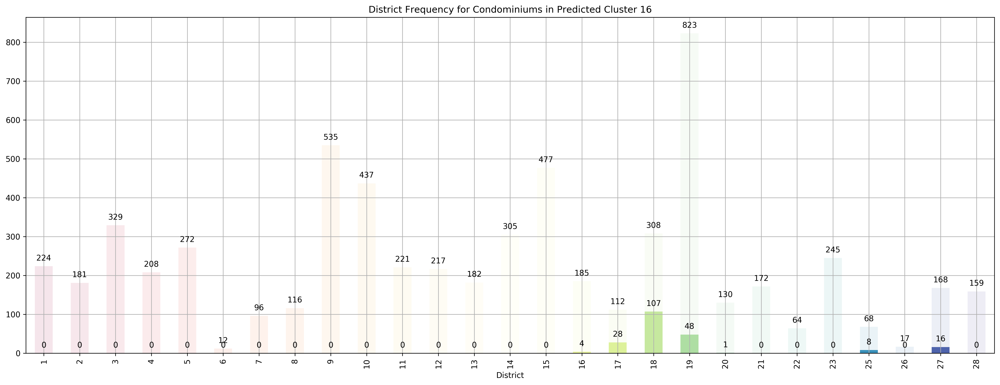

Top 5 districts associated with Predicted Cluster 16:
--------------------------------------------------
1. 18 - Far East - Pasir Ris, Simei, Tampines
2. 17 - Far East - Changi, Loyang, Pasir Ris
3. 25 - Far North - Admiralty, Woodlands
4. 27 - Far North - Admiralty, Sembawang, Yishun
5. 19 - North East - Hougang, Punggol, Sengkang
--------------------------------------------------
--------------------------------------------------


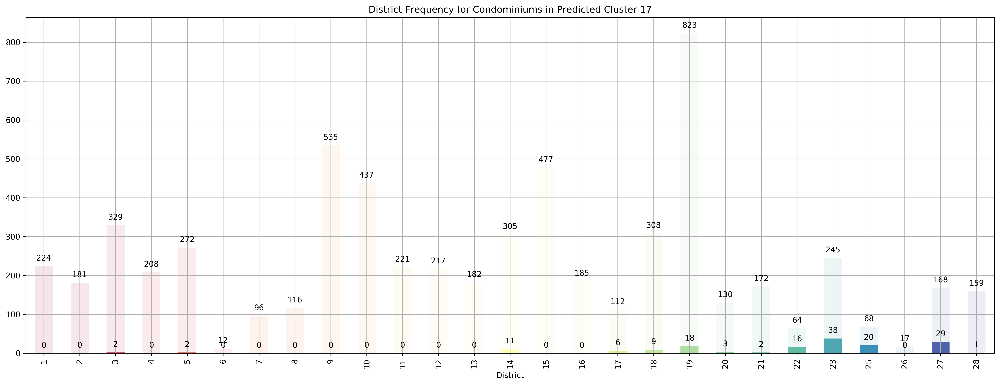

Top 5 districts associated with Predicted Cluster 17:
--------------------------------------------------
1. 25 - Far North - Admiralty, Woodlands
2. 22 - Far West - Boon Lay, Jurong, Tuas
3. 27 - Far North - Admiralty, Sembawang, Yishun
4. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
5. 17 - Far East - Changi, Loyang, Pasir Ris
--------------------------------------------------
--------------------------------------------------


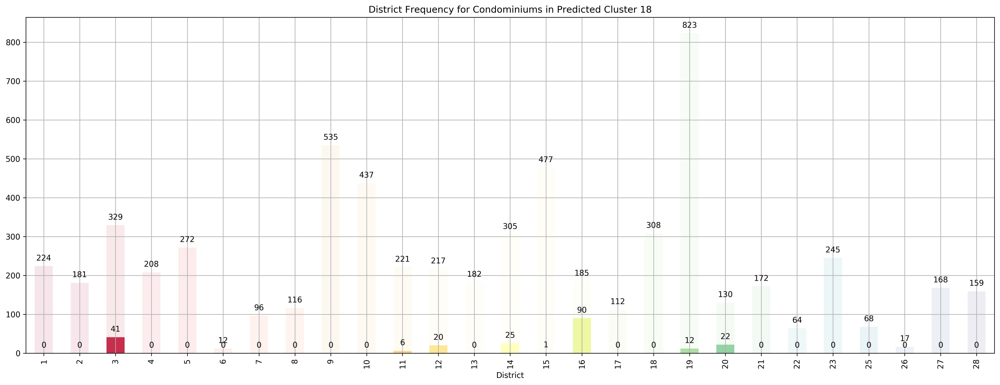

Top 5 districts associated with Predicted Cluster 18:
--------------------------------------------------
1. 16 - Upper East Coast - Bayshore, Bedok, Chai Chee
2. 20 - Central North - Ang Mo Kio, Bishan, Braddell Road, Thomson
3. 3 - Central South - Alexandra Road, Tiong Bahru, Queenstown
4. 12 - Central - Balestier, Moulmein, Novena, Toa Payoh
5. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
--------------------------------------------------
--------------------------------------------------


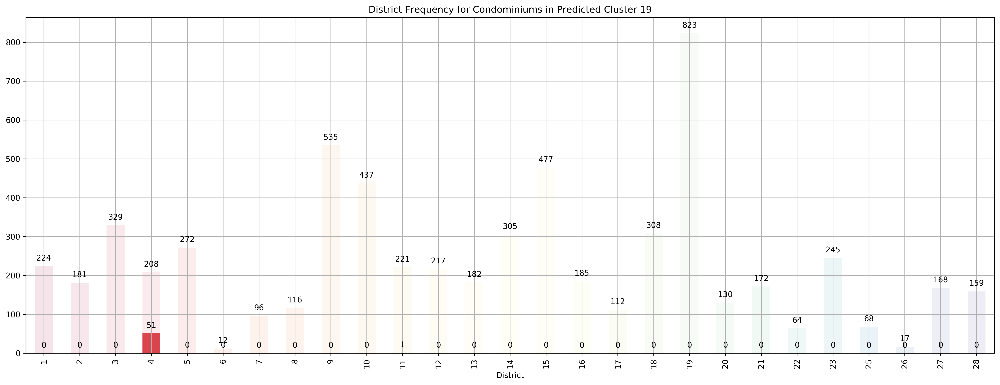

Top 5 districts associated with Predicted Cluster 19:
--------------------------------------------------
1. 4 - South - Keppel, Mount Faber, Sentosa, Telok Blangah
2. 11 - Central Near Orchard - Chancery, Bukit Timah, Dunearn Road, Newton
3. 28 - North East - Seletar, Yio Chu Kang
4. 13 - Central East - Potong Pasir, Machpherson
5. 2 - City Business District - Anson Road, Chinatown, Neil Road, Raffles Place, Shenton Way, Tanjong Pagar
--------------------------------------------------
--------------------------------------------------


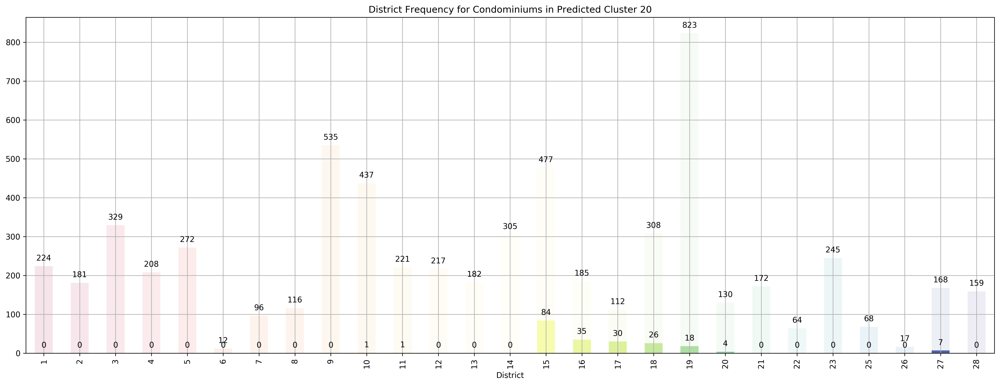

Top 5 districts associated with Predicted Cluster 20:
--------------------------------------------------
1. 17 - Far East - Changi, Loyang, Pasir Ris
2. 16 - Upper East Coast - Bayshore, Bedok, Chai Chee
3. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
4. 18 - Far East - Pasir Ris, Simei, Tampines
5. 27 - Far North - Admiralty, Sembawang, Yishun
--------------------------------------------------
--------------------------------------------------


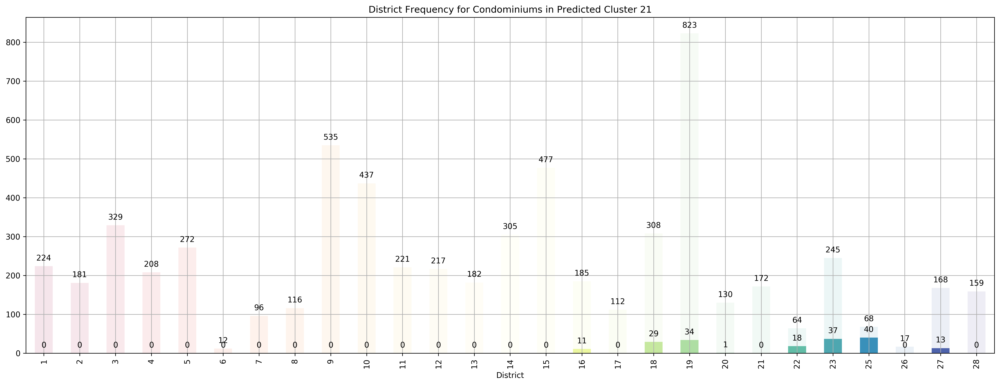

Top 5 districts associated with Predicted Cluster 21:
--------------------------------------------------
1. 25 - Far North - Admiralty, Woodlands
2. 22 - Far West - Boon Lay, Jurong, Tuas
3. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
4. 18 - Far East - Pasir Ris, Simei, Tampines
5. 27 - Far North - Admiralty, Sembawang, Yishun
--------------------------------------------------
--------------------------------------------------


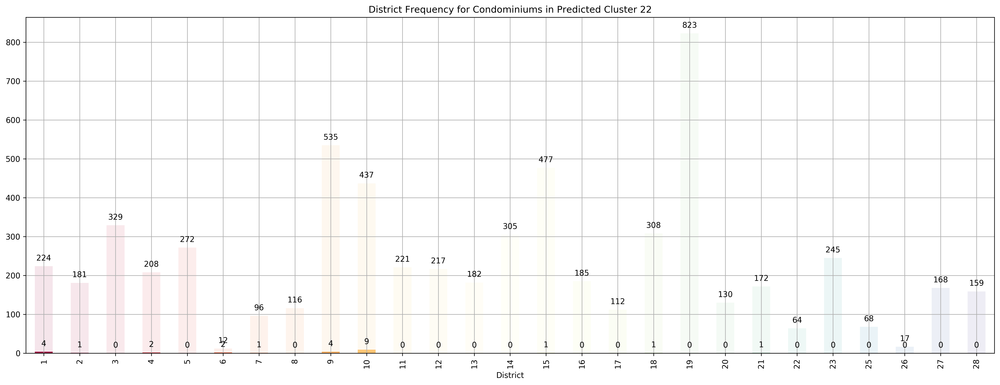

Top 5 districts associated with Predicted Cluster 22:
--------------------------------------------------
1. 6 - City Business District - City Hall, High Street, North Bridge Road
2. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
3. 1 - City Business District - Boat Quay, Chinatown, Havelock Road, Marina Square, Raffles Place, Suntec City
4. 7 - City - Beach Road, Bencoolen Road, Bugis, Rochor
5. 4 - South - Keppel, Mount Faber, Sentosa, Telok Blangah
--------------------------------------------------
--------------------------------------------------


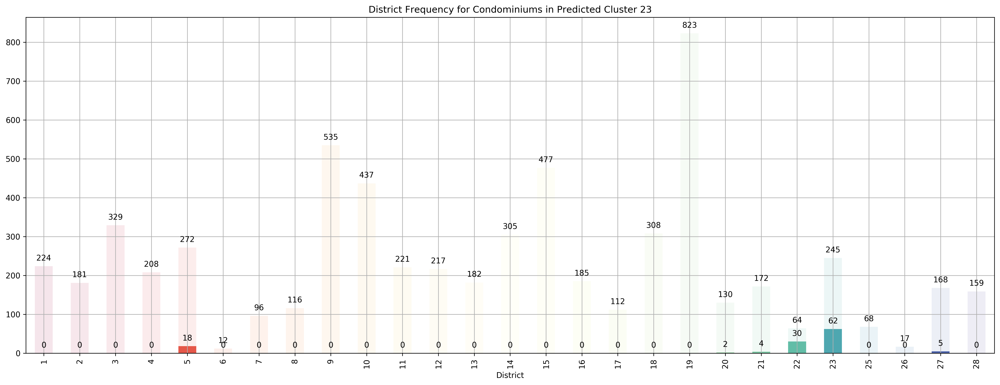

Top 5 districts associated with Predicted Cluster 23:
--------------------------------------------------
1. 22 - Far West - Boon Lay, Jurong, Tuas
2. 23 - North West - Bukit Batok, Choa Chu Kang, Hillview Avenue, Upper Bukit Timah
3. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
4. 27 - Far North - Admiralty, Sembawang, Yishun
5. 21 - Central West - Clementi, Upper Bukit Timah, Hume Avenue
--------------------------------------------------
--------------------------------------------------


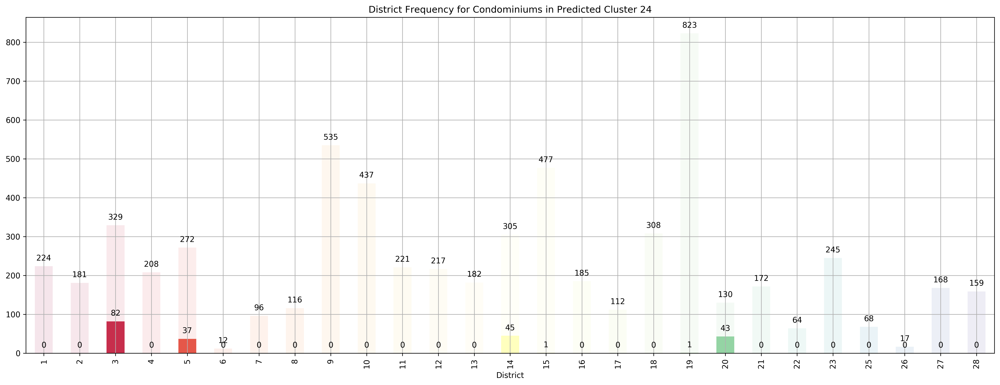

Top 5 districts associated with Predicted Cluster 24:
--------------------------------------------------
1. 20 - Central North - Ang Mo Kio, Bishan, Braddell Road, Thomson
2. 3 - Central South - Alexandra Road, Tiong Bahru, Queenstown
3. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
4. 5 - South West - Buona Vista, Dover, Pasir Panjang, West Coast
5. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
--------------------------------------------------
--------------------------------------------------


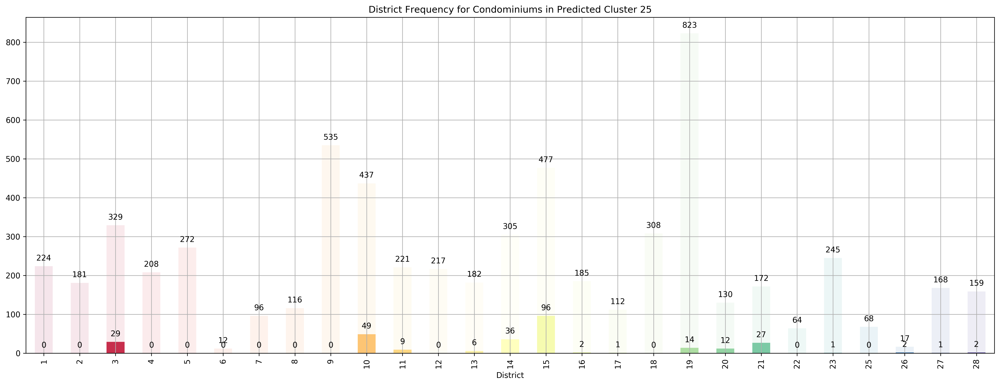

Top 5 districts associated with Predicted Cluster 25:
--------------------------------------------------
1. 15 - East Coast - Katong, Marine Parade, Siglap, Tanjong Rhu
2. 21 - Central West - Clementi, Upper Bukit Timah, Hume Avenue
3. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
4. 26 - North - Tagore, Yio Chu Kang
5. 10 - Central Near Orchard - Balmoral, Bukit Timah, Grange Road, Holland, Orchard Boulevard, River Valley, Tanglin Road
--------------------------------------------------
--------------------------------------------------


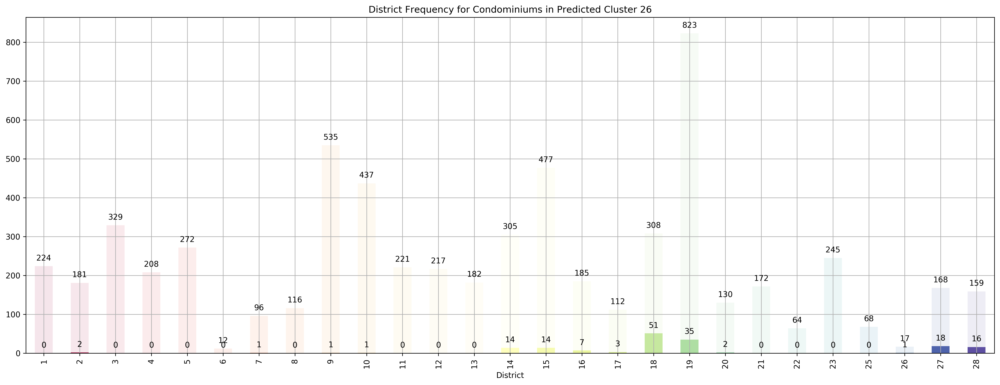

Top 5 districts associated with Predicted Cluster 26:
--------------------------------------------------
1. 18 - Far East - Pasir Ris, Simei, Tampines
2. 27 - Far North - Admiralty, Sembawang, Yishun
3. 28 - North East - Seletar, Yio Chu Kang
4. 26 - North - Tagore, Yio Chu Kang
5. 14 - Central East - Eunos, Geylang, Kembangan, Paya Lebar
--------------------------------------------------
--------------------------------------------------


In [23]:
cluster_district_breakdown(clustered_df, condo_X)

Coincidentally, we got $k=27$ as the best number of clusters for our data, very close to the 28 districts in Singapore. However, our clusters arent exactly like the ones in the 28 districts as virtually all the 27 clusters overlap various districts, not just a cluster for  each district. Although, the clusters do not seem too random and do appear to cluster some apartments quite logically. As you can see, Cluster 0 covers mostly Far East apartments, Clusters 1 and 8 covers mostly central apartments, Clusters 15 and  17 cover mostly North-west apartments, and Clusters 20 and 26 cover mostly Far-east / Far-north apartments.

## 2. Feature Importance / Regression Analysis 

Out of the physical features of the property we have gathered in our dataset, are there any that are most helpful in predicting the price of the house?

In [24]:
# Initialize a Random forest regressor
rf = RandomForestRegressor(n_estimators=1000)

# Fit the Cross validated estimators
cv_results = cross_validate(
    estimator=rf, 
    X=X_scaled.drop(['price'], axis=1), 
    y=y_scaled, 
    scoring=['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error'], 
    cv=5, return_estimator=True)

In [25]:
# Get the cross-validated scores
cv_scores = pd.DataFrame.from_dict({key: cv_results[key] for key in list(cv_results.keys())[3:]})
cv_scores

,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error
0,0.853401,-0.097930,-0.124370
1,0.865073,-0.108507,-0.177327
2,0.903024,-0.104813,-0.106353
3,0.893775,-0.095055,-0.076311
4,0.878629,-0.107987,-0.123859


In [26]:
# Mean Scores across each Random Forest Regressor
cv_scores_mean = cv_scores.mean(axis=0)
cv_scores_mean

test_r2                         0.878781
test_neg_mean_absolute_error   -0.102859
test_neg_mean_squared_error    -0.121644
dtype: float64

In [27]:
rescaled_mae = np.round(y_scaler.inverse_transform([-cv_scores_mean['test_neg_mean_absolute_error']])[0], 2)
rescaled_rmse = np.round(y_scaler.inverse_transform([(-cv_scores_mean['test_neg_mean_squared_error'])**0.5])[0], 2)
print('Rescaled MAE: ${}'.format(rescaled_mae), 'Rescaled RMSE: ${}'.format(rescaled_rmse))

Rescaled MAE: $2267644.54 Rescaled RMSE: $2845858.46


After fitting Random Forest with $5$-fold cross validation, we seem to get pretty good $r^2$ and low MAE and MSE scores. However, once we rescale them back, it appears that we're mispredicting the prices on the scale of millions which is pretty bad. We'll improve that next time, but now let's take a closer look at which features were most important for the price predictions.

In [28]:
def k_feature_plot(importances, columns, idx, ax, k=5):
    ''' 
    Function:
    ---------
    Plots the k most important features
    given a feature_importance_ from an sklearn model
    
    Parameters:
    -----------
    importances: The feature_importances_ from a sklearn model that supports it
    columns: The feature names of those that were used in fitting the model
    idx: The index of estimator
    ax: The axis to plot the figure on
    k: The top k features that were important in the prediction
    
    Returns:
    --------
    None
    '''
    # Display the five most important features
    indices = np.argsort(importances)[::-1]
    columns = columns.values[indices[:k]]
    values = importances[indices][:k]

    # Creat the plot
    ax.set_title("Normalized Weights for First Five Most Predictive Features of RandomForestRegressor {}".format(idx), fontsize = 15)
    ax.bar(np.arange(5), values, width = 0.6, align="center", color = '#00A000', \
           label = "Feature Weight")
    ax.bar(np.arange(5) - 0.3, np.cumsum(values), width = 0.2, align = "center", color = '#00A0A0', \
           label = "Cumulative Feature Weight")
    ax.set_ylabel("Weight", fontsize = 15)
    ax.set_xlabel("Feature", fontsize = 15)
    ax.set_xticks(np.arange(len(columns)))
    ax.set_xticklabels(columns)
    ax.grid()

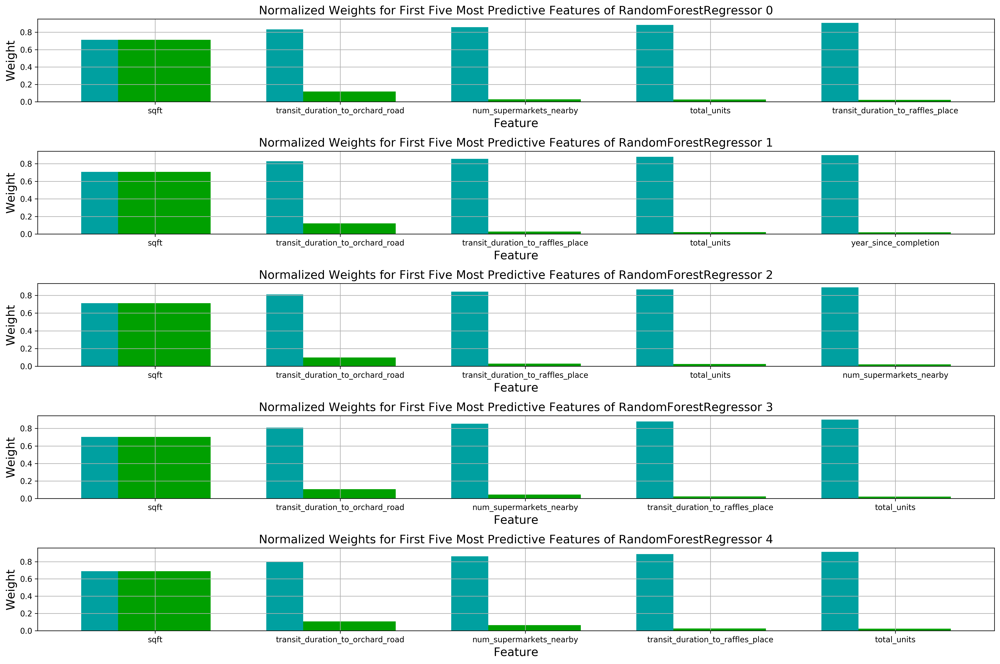

In [29]:
# Plot the feature importance for each regressor
fig, ax = plt.subplots(5, 1)
for idx, estimator in enumerate(cv_results['estimator']):
    k_feature_plot(estimator.feature_importances_, 
                   X_scaled.drop(['price'], axis=1).columns, 
                   idx,
                   ax=ax[idx])
plt.tight_layout()
plt.show();

We will be using the built-in `feature_importance_` attribute of most sklearn Tree models - how the feature importance is calculated can be better understood [here](https://alexisperrier.com/datascience/2015/08/27/feature-importance-random-forests-gini-accuracy.html), noting that RandomForestRegressor implements *Gini importance* or in layman terms, how important a feature is will be proportionate  to the number of times it is used in making a split in building the Decision Tree. It appears the `sqft` is the most important feature so far in making a prediction of the house  price, making intuitive sense since larger houses tend to command a higher price. Next up would be the `transit_duration_to_orchard_road`. This makes perfect sense since the apartments located in the prime shopping district in Singapore (Orchard Road) are known to be more luxurious and command a higher price for its accessibility. Following would be either `num_supermarkets_nearby` (Measure of Accessibility), `transit_duration_to_raffles_place` (Another Measure of Accessibility), or `total_units` (Density of the neighbourhood). 

## 3. Popularity

What are the "hottest" properties now, especially in the District 9, 10, 11 area (Primary Shopping district)?

I'm by far no expert on properties. However, I have heard that how "valuable" a piece of property is can be approximiately attributed to how much land is owned by the property development, so that's the first step we're going to do - find the size of land owned by each of the District 9, 10, and 11 property developments. Afterwards, we'll gather a few of the property developments that own the largest land plots and check out which of them are the most popular recently.

Below we have a few functions dedicated to retrieving the Tranfaction history of the condominiums in districts 9, 10, 11.

In [30]:
class TransactionHistory():
    """
    Purpose:
    --------
    To act as a placeholder for a class' transaction history related
    data

    Parameters:
    -----------
    cluster_id: A str containing the cluster_id of the specific condominium
    rent_df: A pandas dataframe of the rental transaction history returned by get_transact_history
    sale_df: A pandas dataframe of the sale transaction history returned by get_transact_history
    price_trends_dict: Dictionary of the price trend features returned by get_price_trends
    """
    def __init__(self, url, cluster_id, 
                 rent_df, sale_df, price_trends_dict):
        self.url = url
        self.cluster_id = cluster_id
        self.rent = rent_df
        self.sale = sale_df
        self.price_trends = price_trends_dict

def save_object(obj, filename):
    """
    Function:
    ---------
    Pickles an object (Class definition still required to unpickle the object)
    
    Parameters:
    -----------
    obj: object to be pickled
    filename: file to save the object to
    """
    with open(filename, 'wb') as output:  # Overwrites any existing file.
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)

def get_transactions(X, districts=[9, 10]):
    """
    Function:
    ---------
    To retrieve the transaction history related data for all 
    districts interested and save them to a json file
    
    Parameters:
    -----------
    X: The dataframe containing the condo features with links to property page and district label
    districts: A list of the districts of interest in int
    
    Returns:
    --------
    Returns a dictionary of key: cluster_id, val: TransactionHistory object containing 
    data related to the property and also saves the data to a json file
    """
    # The transaction history dictionary that will keep 
    # all the data
    transaction_history = {}
    try:
        for idx in districts:
            for condo_url in tqdm(X[X['District'] == 'D{}'.format(idx)]['link'].unique()):
                cluster_id = get_cluster_id(condo_url) # Retrieve cluster id from property page
                if cluster_id != None:
                    # Create TransactionHistory object with the data
                    transaction_history[cluster_id] = TransactionHistory(
                        url=condo_url,
                        cluster_id=cluster_id,
                        rent_df=get_transact_history(cluster_id=cluster_id, 
                                                     transaction_type='rent').set_index(['Date']),
                        sale_df=get_transact_history(cluster_id=cluster_id,
                                                     transaction_type='sale').set_index(['Date']),
                        price_trends_dict=get_price_trends(cluster_id=cluster_id)
                    )
                else:
                    print('cluster_id for {} could not be found ...'.format(condo_url))
                # Save the TransactionHistory objects acquired after each property scraping
                save_object(transaction_history, './data/99.co/transaction_history.pkl')

    finally:
        save_object(transaction_history, './data/99.co/transaction_history.pkl')
        return transaction_history

In [31]:
# Run this once
# condo_transaction_history = get_transactions(condo_X, districts=[9, 10, 11])

In [32]:
# Read in the transaction histories of the district 9, 10, 11 condos
condo_transaction_history_saved = pickle.load(open("./data/99.co/transaction_history.pkl", "rb"))

In [33]:
def get_property_dev_shape(url):
    """
    Function:
    ---------
    Retrieves the latitude and longitude coordinates from 99.co's 
    webpage through the specified url, and get's the coordinates of the master plan
    area from URA
    
    Parameters:
    -----------
    url: The property development webpage from 99.co
    
    Returns:
    --------
    Polygon object of the coordinates of the property development
    """
    res = requests.get(url)
    if res.ok:
        if 'query_coords' in res.text:
            query_coords_pos = res.text.find('query_coords')
            first_occurence = [res.text[match.start():match.end()+100] for match in re.finditer('query_coords', res.text)][0]
            if '=' in first_occurence:
                y, x = urllib.parse.unquote(first_occurence.split('=')[1].split('&')[0]).split(',')
            else:
                y, x = first_occurence.split(':')[1].replace('\"', '').split(',')[:2]
            
            params = {
                'returnGeometry': 'true', 
                'where': '1=1',
                'outSr': '4326', 
                'outFields': 'name,lu_desc,lu_dt_cd,gpr_num,region_n,pln_area_n,subzone_n',
                'inSr': '4326',
                'geometry': str({'x': float(x), 'y': float(y), 'spatialReference': {'wkid': 4326} }),
                'geometryType': 'esriGeometryPoint',
                'spatialRel': 'esriSpatialRelWithin', 
                'f':'json'
            }

            # Get the Shape of the property development from
            # the URA website
            ura_res = requests.get('https://www.ura.gov.sg/arcgis/rest/services/maps2/Updated_Gaz_MP14_Land_Use_Maps/MapServer/55/query', 
                                   params=params)
            
            if ura_res.ok:
                return Polygon(json.loads(ura_res.text)['features'][0]['geometry']['rings'][0])
            else:
                print('Failed to request coordinates from URA ...')
        else:
            print('Failed to find query_coords from {} source ...'.format(url))
    else:
        print('Failed to request {} ...'.format(url))
        
def get_development_gdf(condo_transaction_history_saved):
    """
    Function:
    ---------
    Retrieve the 
    """
    property_development_info = []
    for idx, (condo_cluster_id, transaction_history_data) in tqdm(enumerate(condo_transaction_history_saved.items())):
        property_dev_shape = get_property_dev_shape(transaction_history_data.url)
        if property_dev_shape != None:
            property_development_info.append((condo_cluster_id, 
                                              transaction_history_data.url.split('/')[-1], 
                                              property_dev_shape))
            
    # Unzip the data
    ids, names, shapes = list(zip(*property_development_info))  
    
    # Create the Geodataframe
    development_gdf = gpd.GeoDataFrame(data=list(zip(names, shapes)),
                                       columns=['name', 'geometry'],
                                       geometry='geometry',
                                       index=ids)

    # Initialize which Coordinate Reference System
    # the Polygons are from
    development_gdf.crs = {'init': 'epsg:4326'}

    # Convert to Singapore's Coordinate Reference System
    development_gdf.to_crs({'init': 'epsg:3414'}, inplace=True)
    
    # Add the areas of each property to the dataframe and return it
    development_gdf = gpd.pd.concat([development_gdf,
                                     pd.Series([shape.area for shape in development_gdf['geometry']],
                                               name='area',
                                               index=development_gdf.index)], axis=1)
    development_gdf.to_csv('./data/99.co/development_gdf.csv')
    return development_gdf

In [34]:
# Run this once
# development_gdf = get_development_gdf(condo_transaction_history_saved)

In [35]:
# Read in the csv saved after running the function on top once
development_gdf = pd.read_csv('./data/99.co/development_gdf.csv', index_col=[0])
development_gdf['geometry'] = development_gdf['geometry'].apply(wkt.loads)
development_gdf = gpd.GeoDataFrame(development_gdf, geometry='geometry')
development_gdf.head()

,name,geometry,area
deBww68UZiCQC9buT6HJHn94,visioncrest,"POLYGON ((29120.39317503387 31253.28339999881,...",11289.354705
dezffmfUfU7j2AZq7SaCZcAV,oxley-edge,"POLYGON ((28939.530100035 30894.11250000041, 2...",203.460535
de64sRpu6B5kL5ZMqsy3aY83,up-robertson-quay,"POLYGON ((28491.80500003405 30342.27099999937,...",4426.059840
derjk2a5yZokjVVzgWUYuGQk,martin-modern,"POLYGON ((28482.45400003335 30697.33899999934,...",15932.145784
deN7jqPZMK4qXzbqkDinAfG,8-saint-thomas,"POLYGON ((28309.86910003353 30930.41400000046,...",5544.545664


We see that we've amassed a GeoDataFrame of the `name`s of the property developments, their `geometry`, as well as their `area` calculated from their `geometry`. Let's plot them out to see how their shapes look like.

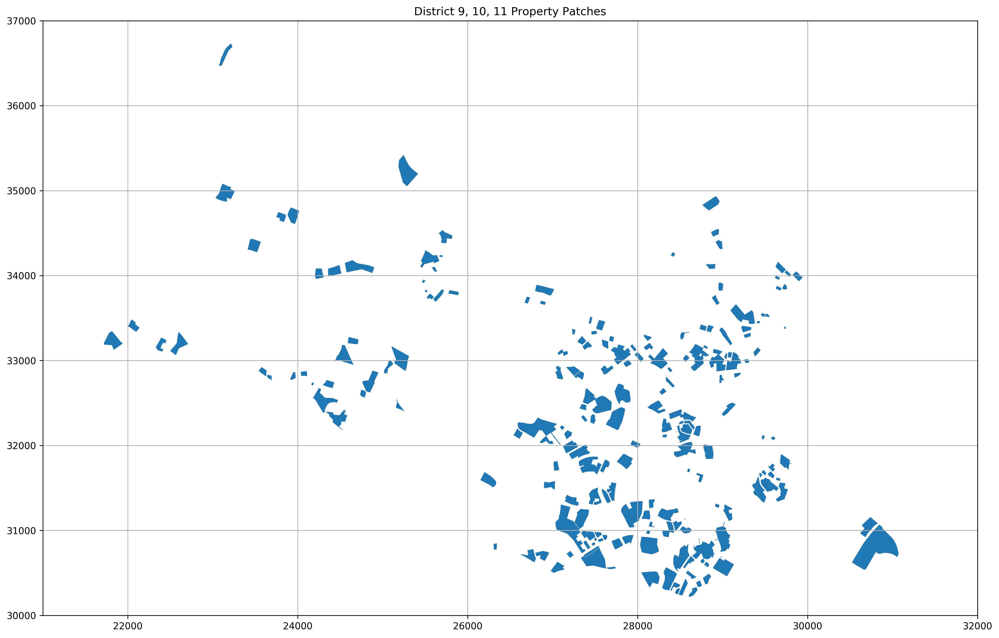

In [36]:
fontprops = fm.FontProperties(size=18)
fig, ax = plt.subplots(1, 1, sharex=True)

development_gdf['geometry'].plot(ax=ax)
ax.set_xlim(left=21e3, right=32e3)
ax.set_ylim(bottom=30e3, top=37e3)
ax.set_title('District 9, 10, 11 Property Patches')
plt.grid(True)
plt.show();

Let's take a look at the top 10 property developments with the largest land plots.

In [37]:
top_k_largest_land_plots = development_gdf.sort_values('area', ascending=False)[:10]
top_k_largest_land_plots

,name,geometry,area
dexBL54KXwLzrouFwRDi3hN7,wilshire-residences,"POLYGON ((30864.27887503527 31052.52227500042,...",115716.593256
deqZxRuu57uzrKmn4Ens5J36,regency-park,"POLYGON ((27256.02700003375 30869.03209999915,...",47087.735977
deF68BvbTj2wLYXpAj7dczwn,hillcrest-arcadia,"POLYGON ((25416.56400003488 35198.50999999946,...",42056.124362
dew7TKjVatAm5hFhmjKLdX7M,valley-park,"POLYGON ((27551.09300003419 30793.11299999955,...",39980.056713
deuaJk2pf8VRU9SMeXmiwDEe,yong-an-park,"POLYGON ((28045.51162503337 30927.67840000017,...",36974.237415
de9nYaVhEPfhbNsjBHpDAF66,ardmore-park,"POLYGON ((27606.33570003401 32578.22629999893,...",32011.124393
deFd5qdc9n8hLashEVsHZHMm,aspen-heights,"POLYGON ((28896.49600003314 30847.51899999905,...",31986.958901
deVCdvkVV4jAfqfD7ADWXpha,ue-square,"POLYGON ((29030.28200003355 30662.6758999989, ...",29451.902802
deMkfRvrfJxgcNDUD88bZZr4,duchess-crest,"POLYGON ((24714.44400003357 34142.49999999967,...",29194.881756
deDvLbh3PZNsQDf8eU8RayE5,four-seasons-park,"POLYGON ((27528.63000003443 31865.73899999973,...",27849.010938


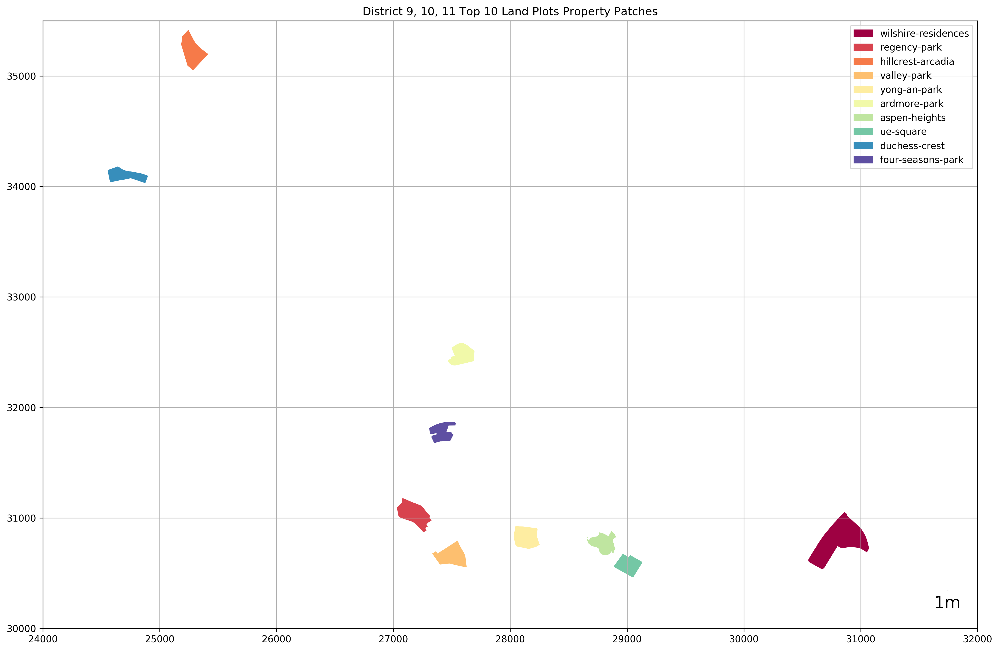

In [38]:
fontprops = fm.FontProperties(size=18)
fig, ax = plt.subplots(1, 1, sharex=True)

# Get color for each property
colors = get_colors(10)
for idx, (cluster_id, row) in enumerate(top_k_largest_land_plots[['name', 'geometry']].iterrows()):
    ax.add_patch(PolygonPatch(row['geometry'], fc=colors[idx], ec=[1,1,1], linewidth=0.05))
        
bar = AnchoredSizeBar(transform=ax.transData, 
                      size=1, 
                      label='1m', 
                      loc=4, 
                      pad=0.5, 
                      sep=5, 
                      borderpad=0.5, 
                      frameon=False, 
                      size_vertical=0.5, 
                      color='black', 
                      fontproperties=fontprops)
ax.add_artist(bar)

plt.legend(handles=[mpatches.Patch(color=color, label=name) for color, name in list(zip(colors, top_k_largest_land_plots['name']))])

ax.set_xlim(left=24e3, right=32e3)
ax.set_ylim(bottom=30e3, top=35.5e3)
ax.set_title('District 9, 10, 11 Top 10 Land Plots Property Patches')
plt.grid(True)
plt.show();

In [39]:
# Create an empty dictionary of the top 10 
# largest land plot developments as keys to  
# store their transaction history dataframes as the values
condos_of_interest = {cluster_id: None for cluster_id, row in top_k_largest_land_plots.iterrows()}

# Get all the transaction history of SALES of
# the condos of interest and append a column
# of the days since the transactiomn from today
# to the dataframe, storing everything in
# condos_of_interest
for cluster_id in condos_of_interest.keys():
    condo_of_interest_transact_history = condo_transaction_history_saved[cluster_id].sale
    condos_of_interest[cluster_id] = pd.concat([
        condo_of_interest_transact_history,
        pd.Series([(datetime.today() - datetime.strptime(date, '%d/%m/%Y')).days for date in condo_of_interest_transact_history.index], 
                  index=condo_of_interest_transact_history.index, 
                  name='days_since_transaction')], 
                                        axis=1)

The function below will be used to clean each row of the dataframe we've gathered of the transaction history of the property development.

In [40]:
def get_prices(row):
    """
    Function:
    ---------
    Cleans a dataframe row
    
    Parameters:
    -----------
    row: A pandas dataframe row 
    
    Returns:
    --------
    tuple of (price per square foot, floor level, total price, days since transaction)
    """
    if len(re.sub('[^0-9\.]', '', row['Price (psf)'])) > 0 and len(re.sub('[^0-9]', '', row['Unit'])) > 0:
        price = float(re.sub('[^0-9\.]', '', row['Price (psf)']))
        area = float(row['Area'].split()[0].replace(',', ''))
        floor = int(re.sub('[^0-9]', '', row['Unit']))
        if row['Price (psf)'][-1] == 'M':
            return ((price/area)*1e6, 
                    floor,
                    price*1e6, 
                    row['days_since_transaction'])  
        elif row['Price (psf)'][-1] == 'B': 
            return ((price/area)*1e9,
                    floor, 
                    price*1e9, 
                    row['days_since_transaction'])
        else:
            return ((price/area),
                    floor, 
                    price, 
                    row['days_since_transaction'])
    else:
        return (None, None, None, None)

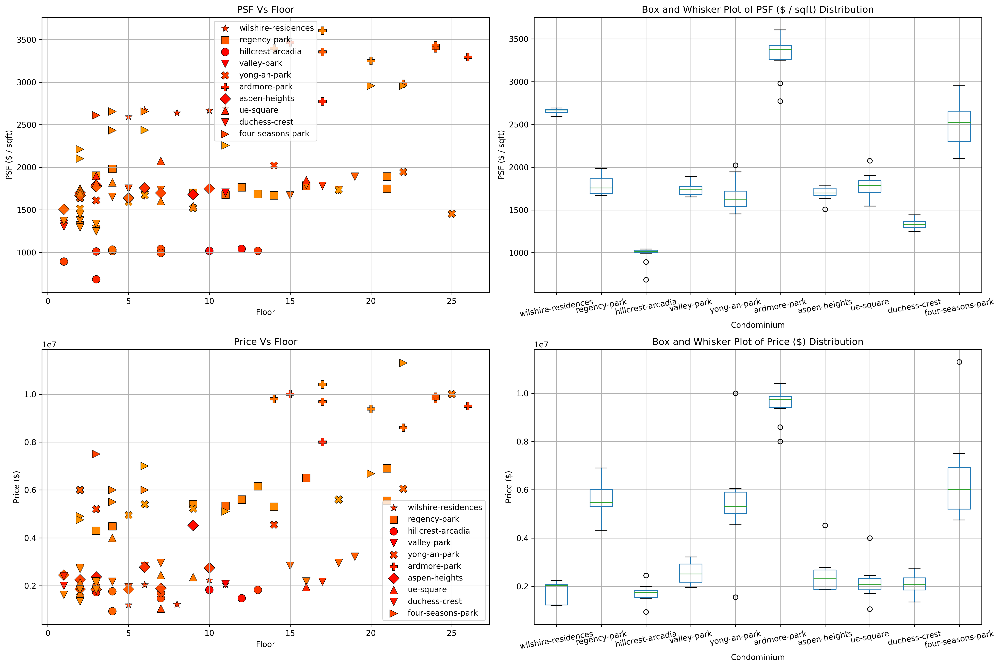

In [41]:
fig, ax = plt.subplots(2, 2)

# Get a set of all the days since transactions for 
# each condo of interest
days_since_transactions = set([days for cluster_id, val in condos_of_interest.items() for days in val['days_since_transaction'].values])

# Scaler for the days since transactions so
# we can display older transactions by a 
# diff color to distinguish from newer ones
days_scaler = matplotlib.colors.LogNorm(vmin=min(days_since_transactions),
                                        vmax=max(days_since_transactions))

# Aggregated condo sale psf and prices dataframe
condos_of_interest_all_psf = pd.DataFrame()
condos_of_interest_all_price = pd.DataFrame()
condos_of_interest_all_days_since_transaction = pd.DataFrame()
condo_names = [] # Get all the names of the condos of interest from condo_transaction_history_saved

# Plots each transaction of each property
# Deeper colors signify more recent transactions while
# Lighter colors are older transactions
for idx, (cluster_id, df) in enumerate(condos_of_interest.items()):
    
    # Get the condo name from condo_transaction_history_saved dictionary
    condo_name = condo_transaction_history_saved[cluster_id].url.split('/')[-1]
    condo_names.append(condo_name)
    
    # Unpack the tuple of psf, level, price and days_since_transaction
    psf, level, price, days_since_transaction = list(zip(*list(filter(None, df.apply(get_prices, axis=1)))))
    
    # Only get the last 10 transactions
    psf, level, price, days_since_transaction = psf[:10], level[:10], price[:10], days_since_transaction[:10]
    ax[0, 0].scatter(level, psf, 
                     c=[plt.cm.autumn(days_scaler(val)) for val in days_since_transaction], 
                     marker='*sovXPD^v><'[idx], s=100, ec=[0,0,0], linewidth=0.5,
                     label=condo_name)
    
    ax[1, 0].scatter(level, price, 
                     c=[plt.cm.autumn(days_scaler(val)) for val in days_since_transaction], 
                     marker='*sovXPD^v><'[idx], s=100, ec=[0,0,0], linewidth=0.5,
                     label=condo_name)
    condos_of_interest_all_psf = pd.concat([condos_of_interest_all_psf,
                                            pd.Series(psf, name=condo_name)], axis=1)
    condos_of_interest_all_price = pd.concat([condos_of_interest_all_price,
                                            pd.Series(price, name=condo_name)], axis=1)
    condos_of_interest_all_days_since_transaction = pd.concat([condos_of_interest_all_days_since_transaction, 
                                                               pd.Series(days_since_transaction, name=condo_name)], axis=1)

ax[0, 0].set_ylabel('PSF ($ / sqft)')
ax[0, 0].set_xlabel('Floor')
ax[0, 0].set_title('PSF Vs Floor')
ax[0, 0].legend()
ax[0, 0].grid(True)

ax[1, 0].set_ylabel('Price ($)')
ax[1, 0].set_xlabel('Floor')
ax[1, 0].set_title('Price Vs Floor')
ax[1, 0].legend()
ax[1, 0].grid(True)

condos_of_interest_all_psf.boxplot(column=condo_names, ax=ax[0, 1], rot=10)
ax[0, 1].set_ylabel('PSF ($ / sqft)')
ax[0, 1].set_xlabel('Condominium')
ax[0, 1].set_title('Box and Whisker Plot of PSF ($ / sqft) Distribution')

condos_of_interest_all_price.boxplot(column=condo_names, ax=ax[1, 1], rot=10)
ax[1, 1].set_ylabel('Price ($)')
ax[1, 1].set_xlabel('Condominium')
ax[1, 1].set_title('Box and Whisker Plot of Price ($) Distribution')

plt.tight_layout()
plt.show();

*In the `PSF Vs. Floor` and `Price Vs. Floor` plots, the deeper the color (more red), the more recent the transaction has taken place.*

In [42]:
condos_of_interest_all_days_since_transaction

,wilshire-residences,regency-park,hillcrest-arcadia,valley-park,yong-an-park,ardmore-park,aspen-heights,ue-square,duchess-crest,four-seasons-park
0,77.0,196,28,25,98,52,32,52,42,112
1,96.0,252,35,84,102,81,46,61,59,388
2,99.0,350,56,87,215,89,76,123,367,406
3,99.0,412,67,146,244,173,96,158,453,462
4,100.0,424,81,206,340,173,108,363,458,563
5,NaN,455,111,235,665,192,125,367,467,641
6,NaN,559,129,241,682,251,158,371,517,672
7,NaN,606,131,279,742,329,215,390,535,781
8,NaN,619,241,306,805,475,216,398,535,860
9,NaN,619,264,346,880,490,238,412,538,966


As we can see, `hillcrest-arcadia` and `aspen-heights` seem to have the most frequent transactions recently and `wilshire-residences` has the shortest transaction history out of all the property developments in districts 9, 10, 11 with the largest land plots. Another noteworthy point would be that `ardmore-park` has the highest price per square foot as seen from the box and whisker's plot, and `leedon-residence` has the greatest standard deviation in  transaction prices.

## 4. Visualize Evolution of PSF over time for D9, 10, 11 Condos [To Be Continued]

In [44]:
all_condos_cleaned_transact_history = {}
for cluster_id in tqdm(condo_transaction_history_saved.keys()):
    sale_transaction_history = pd.concat([
        condo_transaction_history_saved[cluster_id].sale,
        pd.Series([(datetime.today() - datetime.strptime(date, '%d/%m/%Y')).days for date in condo_transaction_history_saved[cluster_id].sale.index], 
                  index=condo_transaction_history_saved[cluster_id].sale.index, 
                  name='days_since_transaction')],
        axis=1)
    psf, level, price, days_since_transaction = list(zip(*list(filter(None, sale_transaction_history.apply(get_prices, axis=1)))))
    all_condos_cleaned_transact_history[cluster_id] = pd.DataFrame(
        np.vstack([psf, level, price, days_since_transaction]).transpose(),
        columns=['psf', 'level', 'price', 'days_since_transaction'])

100%|██████████| 301/301 [00:03<00:00, 91.69it/s] 


In [45]:
psfs = []
for cluster_id, cleaned_transaction_history in all_condos_cleaned_transact_history.items():
    if not condo_transaction_history_saved[cluster_id].sale.empty:
        psfs.append((cluster_id, condo_transaction_history_saved[cluster_id].url.split('/')[-1], cleaned_transaction_history['psf'].max()))
    
sorted(psfs, key=lambda val: float(val[2]), reverse=True)[:10]

[('deW3uHXDGJi6UaiJjkNL43Ja', 'the-marq-on-paterson-hill', 6840.492840492841),
 ('dedxy2cVh9LsnfXCEL25t89G', 'twentyone-angullia-park', 5559.989634620368),
 ('de2fsyAsihPdsy7LdzjmSFLV', 'the-ritzcarlton-residences', 5145.567549885509),
 ('dep92pCMVNVWNK3vntHivs6j', 'boulevard-88', 5124.81401884609),
 ('deAuZ9ecUBhhZGcyUK7r2cRJ', 'skyline-orchard-boulevard', 5011.945845500399),
 ('deHwvYsc6Se2q8ojmrxynboQ', 'reignwood-hamilton-scotts', 5000.0),
 ('der4QDjqEPRUJ2kGW9oPtSDH', 'the-orchard-residences', 4999.999999999999),
 ('de9KYTFKJ4B68yXkPKUnouD3', 'boulevard-vue', 4912.460920053595),
 ('deqcgHYSkWAMfVf56cuhriM6', 'hilltops', 4812.170385395538),
 ('dep4qchyRszaoycMW2sddQhU', '3-orchard-bythepark', 4805.491990846682)]

<a id='eval'></a>

---
# Evaluation [To Be Continued]

<a id='deploy'></a>

---
# Deployment [To Be Continued]

<a id='resources'></a>

---
## Resources
- https://www.99.co/blog/singapore/a-general-guide-to-types-of-housing-in-singapore/
- https://www.99.co/blog/singapore/freehold-vs-leasehold-condos/